# Spotify Songs EDA Project

## A. Predictive Modeling Discussion. 
Do not state the specific models you will use, but you MUST state: 

a.	Are you working on a REGRESSION or CLASSIFICATION problem? 

I am working on a classification problem.

b.	Which variables are inputs? 

playlist_genre, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, duration_ms, release_year, and release_month

c.	Which variables are responses/outputs/outcomes/targets?

track_popularity

d.	Did you need to DERIVE the responses of interest by SUMMARIZING the available data? 

No, I just cleaned the data

e.	If so, what summary actions did you perform

f.	Which variables are identifiers and should NOT be used in the models? 

track_id, track_name, track_artist, track_album_id, track_album_name, playlist_name, playlist_id, and playlist_subgenre should not be included because they are used to identify tracks and they are not useful categories for inputs or outputs. Subgenre is not included because I have already included genre in my variables.

g.	Important: Answer this question after completing parts C and D. Return to this predictive modeling discussion section to answer the following: 

i.	Which of the inputs do you think influence the response, based on your exploratory visualizations? Which exploratory visualization helped you identify potential input-to-output relationships? (If you are not sure which inputs seem to influence the response, it is okay to say so.)

I am not sure which inputs seem to influence the response.

## B.	Exploratory Data Analysis. Complete these general requirements: 

### Import modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Read data

In [2]:
data_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

df = pd.read_csv(data_url)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

### b.	You must perform the ESSENTIAL Exploration activities: 

#### i. Display the number of rows and columns.

In [4]:
df.shape

(32833, 23)

#### ii.	Display the column names and their associated data types. 

In [5]:
df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

#### iii.	Display the number of missing values for each column. 

In [6]:
df.isna().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

#### iv.	Display the number of unique values for each column.

In [7]:
df.nunique()

track_id                    28356
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22545
track_album_name            19743
track_album_release_date     4530
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17684
duration_ms                 19785
dtype: int64

### c.	You must state whether you want to effectively treat a numeric column as a non-numeric for exploration purposes.

I will be treating key and mode as categorical variables for exploration purposes. Key represents different musical keys such as C, D, E, etc. which are categories and not numerical values. Mode represents the major and minor key which is a binary categorical variable. 

In [8]:
df_copy = df.copy()

In [9]:
df_copy['key'] = df_copy['key'].astype('category')
df_copy['mode'] = df_copy['mode'].astype('category')

### d. You do NOT need to display the COUNTS for categorical variables because you will visually display the variables. However, you may display/print COUNTS if it helps you.

I will be checking for duplicates in the dataset and cleaning the data to ensure that repeated tracks do not skew my results.

In [10]:
df.track_id.nunique()

28356

In [11]:
df.groupby(['track_id', 'track_album_id', 'playlist_id']).size()\
.reset_index(name='num_rows').num_rows.value_counts()

num_rows
1    31719
2      482
3       50
Name: count, dtype: int64

In [12]:
df.groupby(['track_id']).\
aggregate(num_track_pop_values = ('track_popularity', 'nunique'),
          num_valence_values = ('valence', 'nunique')).\
reset_index().\
nunique()

track_id                28356
num_track_pop_values        1
num_valence_values          1
dtype: int64

I will convert all of the dates in the dataset to a datetime format to allow for data cleaning. It also forces any dates that can't be converted to be changed into NaT instead of causing an error. 

In [13]:
df_copy['track_album_release_date_dt'] = pd.to_datetime( df['track_album_release_date'], errors='coerce' )

In [14]:
df_copy['track_album_release_date_dt'].isna().sum()

1886

In [15]:
df_clean = df_copy.dropna(subset=['track_album_release_date_dt'])

In [16]:
df_clean = df_clean.drop_duplicates(subset=['track_id'], keep='first')

In [17]:
df_clean['track_popularity_binary'] = np.where(df_clean['track_popularity'] > 50, 1, 0)

In [18]:
df_clean['track_popularity_binary'].value_counts()

track_popularity_binary
0    16777
1     9898
Name: count, dtype: int64

In [19]:
df_clean['release_year'] = df_clean['track_album_release_date_dt'].dt.year
df_clean['release_month'] = df_clean['track_album_release_date_dt'].dt.month

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


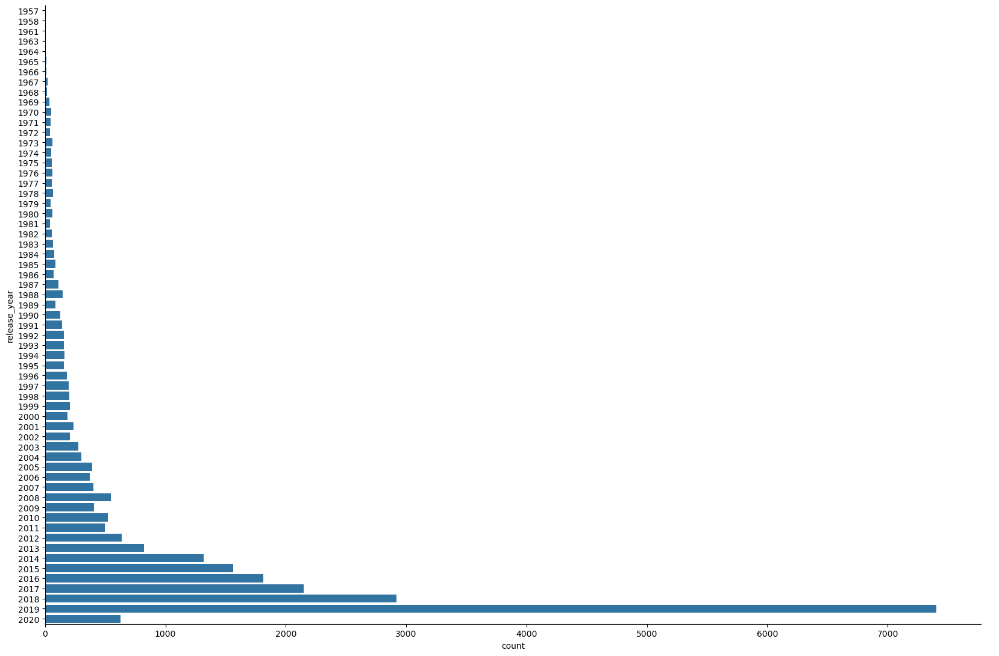

In [20]:
sns.catplot(data = df_clean, y='release_year', kind='count', height=11, aspect=1.5)

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


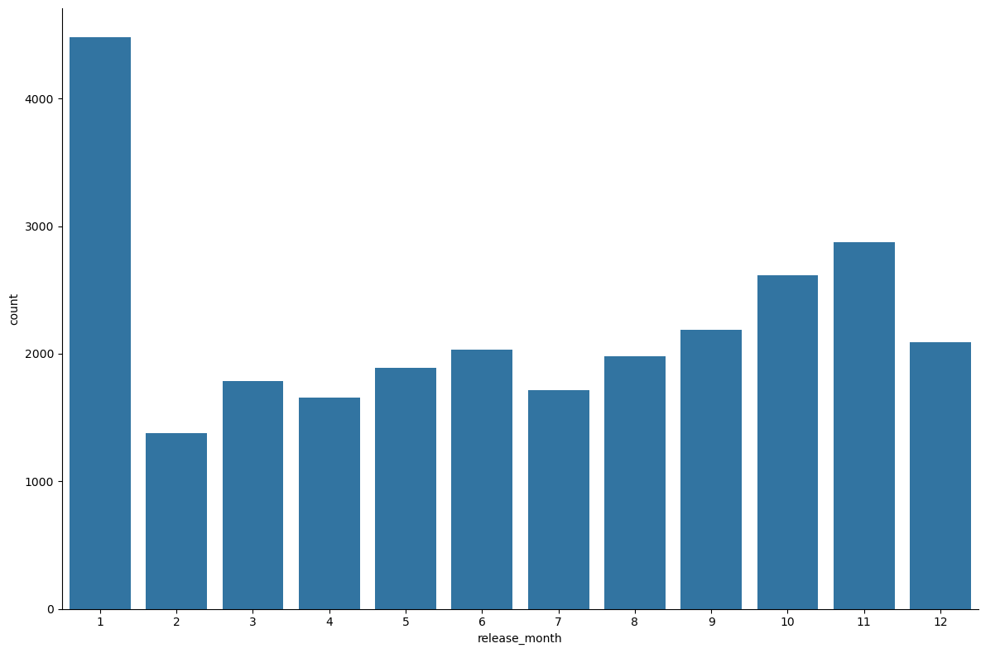

In [21]:
sns.catplot(data = df_clean, x='release_month', kind='count', height=8, aspect=1.5)

plt.show()

In [22]:
df_clean['release_category'] = np.where(df_clean['release_year'] < 2010, 'older', 'recent')

In [23]:
df_clean = df_clean.drop(columns=[
    'track_id', 
    'track_album_id', 
    'playlist_id', 
    'track_name', 
    'track_album_name', 
    'playlist_name', 
    'playlist_subgenre',
    'track_artist'
])

### e.	You must visualize the MARGINAL distributions for ALL variables in your data. 

#### i.	Continuous variables: Histograms or density plots.

Continuous Variable: Danceability

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


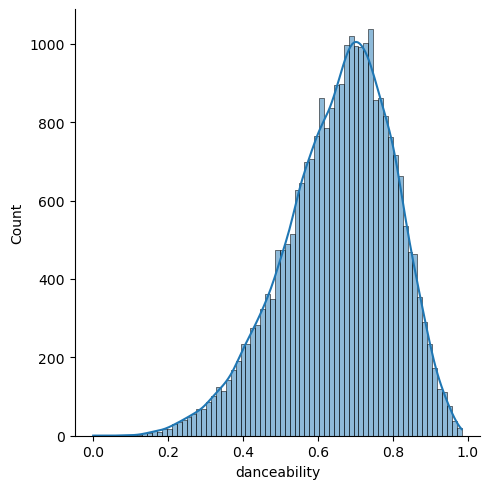

In [24]:
sns.displot(data = df_clean, x='danceability', kind='hist', kde = True)

plt.show()

Continuous Variable: Energy

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


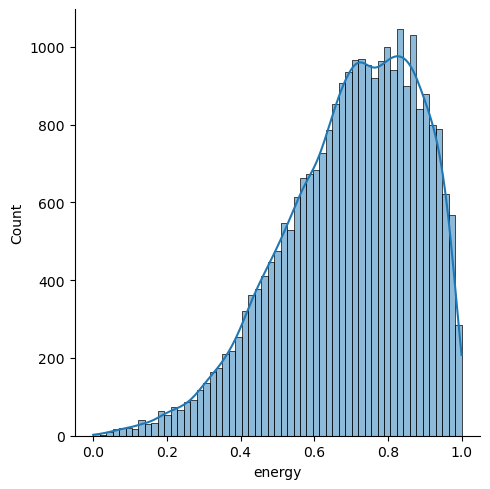

In [25]:
sns.displot(data = df_clean, x='energy', kind='hist', kde = True)

plt.show()

Continuous Variable: Loudness

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


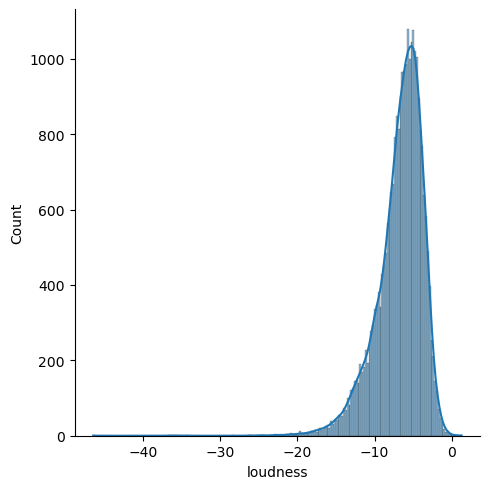

In [26]:
sns.displot(data = df_clean, x='loudness', kind='hist', kde = True)

plt.show()

Continuous Variable: Speechiness

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


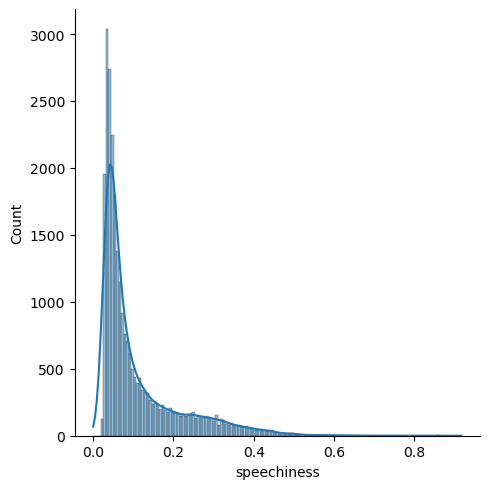

In [27]:
sns.displot(data = df_clean, x='speechiness', kind='hist', kde = True)

plt.show()

Continuous Variable: Acousticness

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


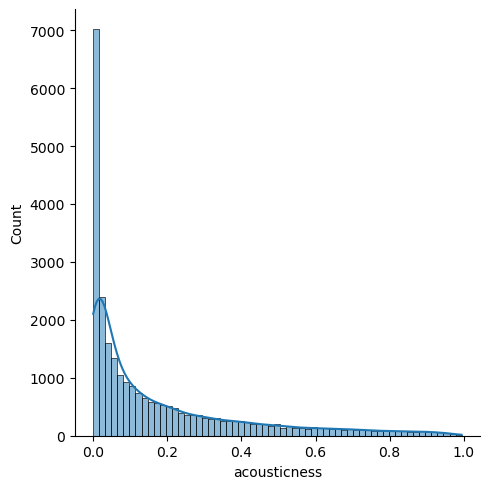

In [28]:
sns.displot(data = df_clean, x='acousticness', kind='hist', kde = True)

plt.show()

Continuous Variable: Instrumentalness

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


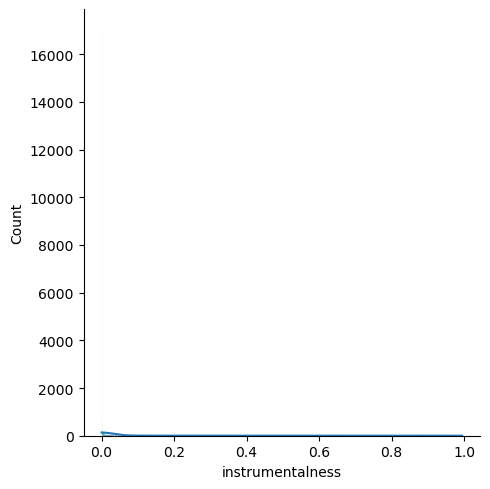

In [29]:
sns.displot(data = df_clean, x='instrumentalness', kind='hist', kde = True)

plt.show()

Continuous Variable: Liveness

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


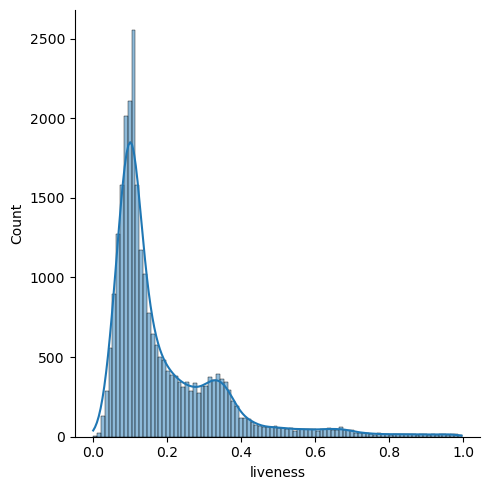

In [30]:
sns.displot(data = df_clean, x='liveness', kind='hist', kde = True)

plt.show()

Continuous Variable: Valence

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


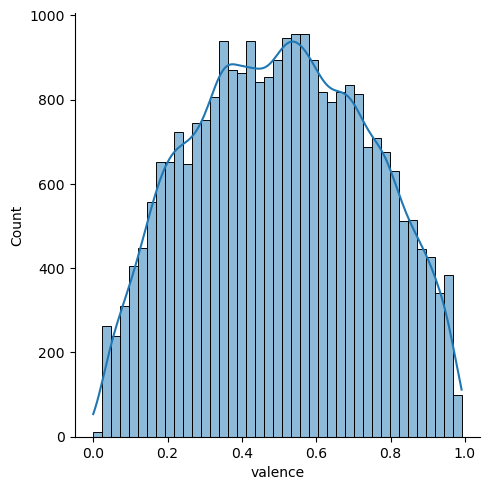

In [31]:
sns.displot(data = df_clean, x='valence', kind='hist', kde = True)

plt.show()

Continuous Variable: Tempo

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


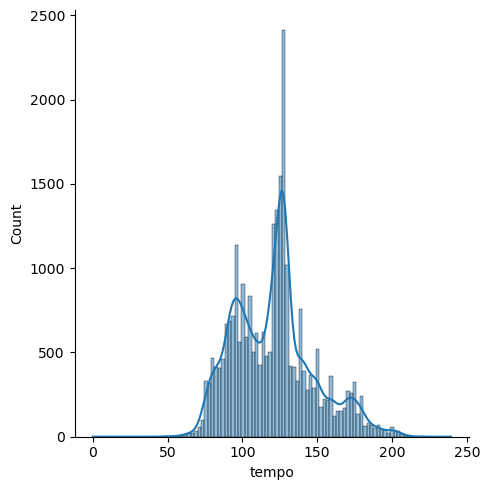

In [32]:
sns.displot(data = df_clean, x='tempo', kind='hist', kde = True)

plt.show()

Continuous Variable: Duration_ms

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


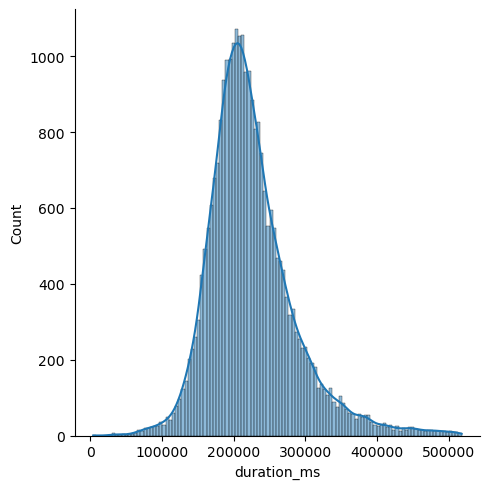

In [33]:
sns.displot(data = df_clean, x='duration_ms', kind='hist', kde = True)

plt.show()

#### ii.	Categorical variables: Bar charts. 

Categorical variable: Playlist Genre

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


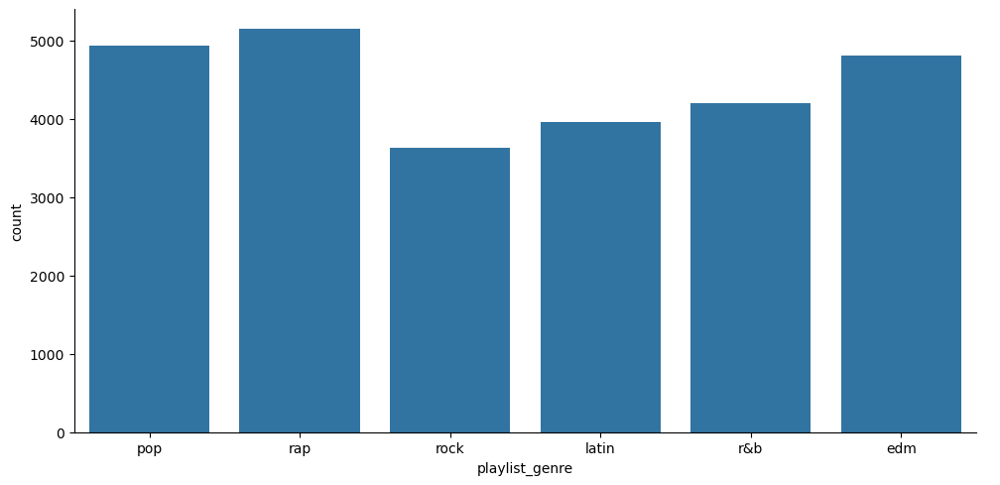

In [34]:
sns.catplot( data = df_clean, x='playlist_genre', kind='count' , aspect = 2)

plt.show()

Categorical variable: key

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


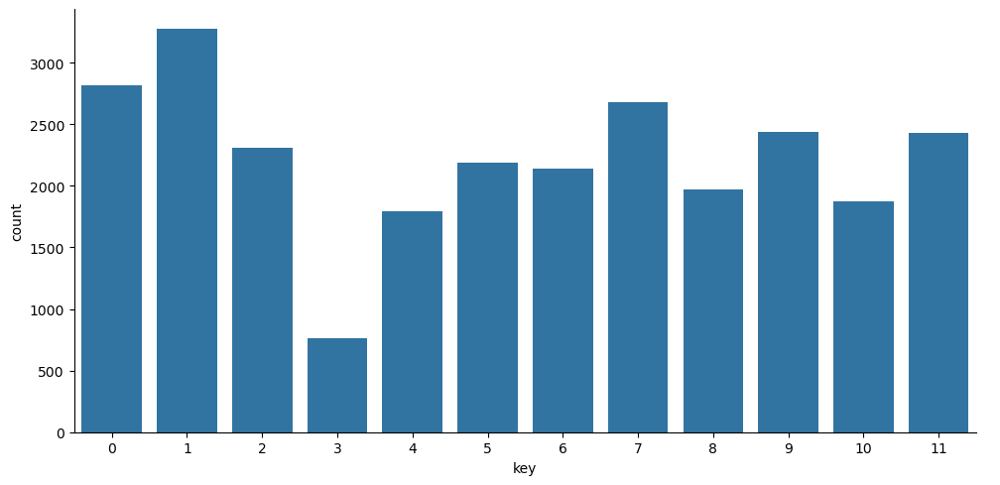

In [35]:
sns.catplot( data = df_clean, x='key', kind='count' , aspect = 2)

plt.show()

Categorical variable: mode

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


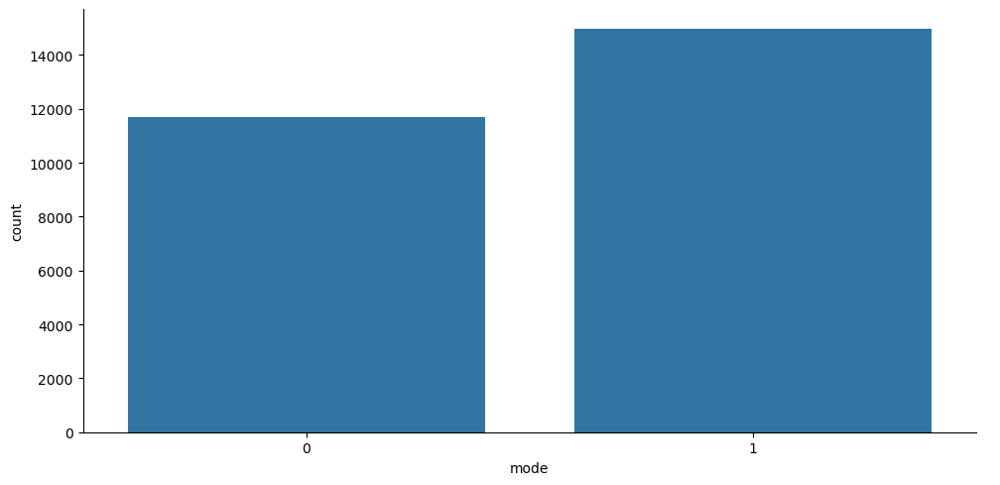

In [36]:
sns.catplot( data = df_clean, x='mode', kind='count' , aspect = 2)

plt.show()

Categorical variable: Track Popularity

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


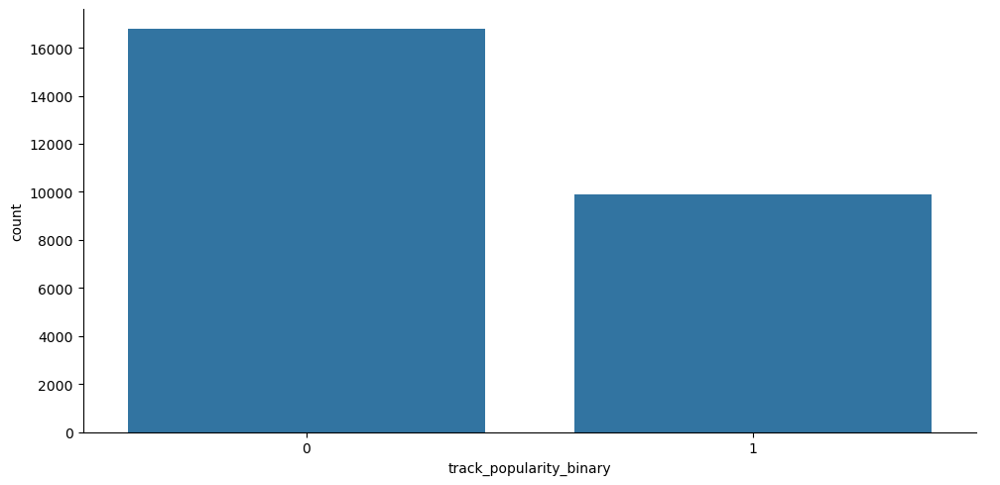

In [37]:
sns.catplot( data = df_clean, x='track_popularity_binary', kind='count' , aspect = 2)

plt.show()

Categorical variable: Release Year

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


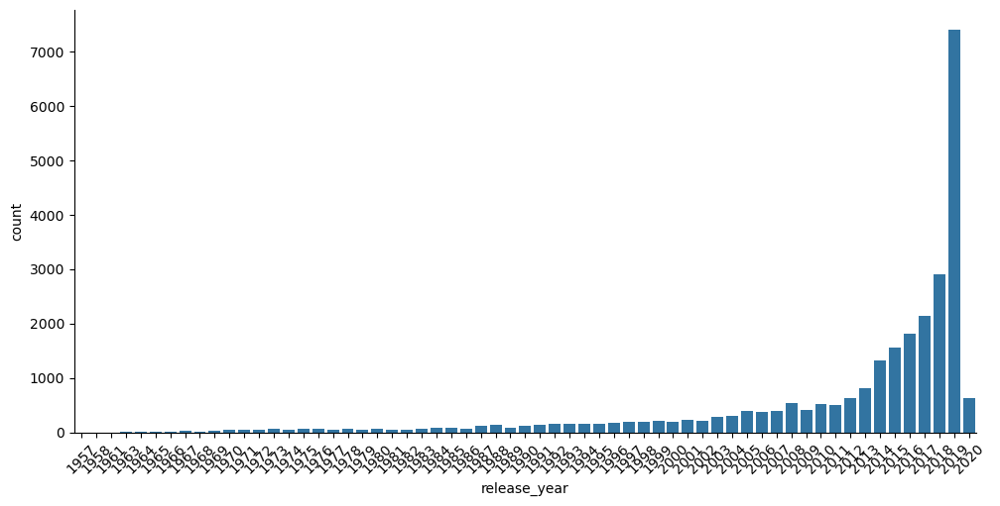

In [38]:
g = sns.catplot(data=df_clean, x='release_year', kind='count', aspect=2)
g.set_xticklabels(rotation=45) 
plt.show()

Categorical variable: Release month

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


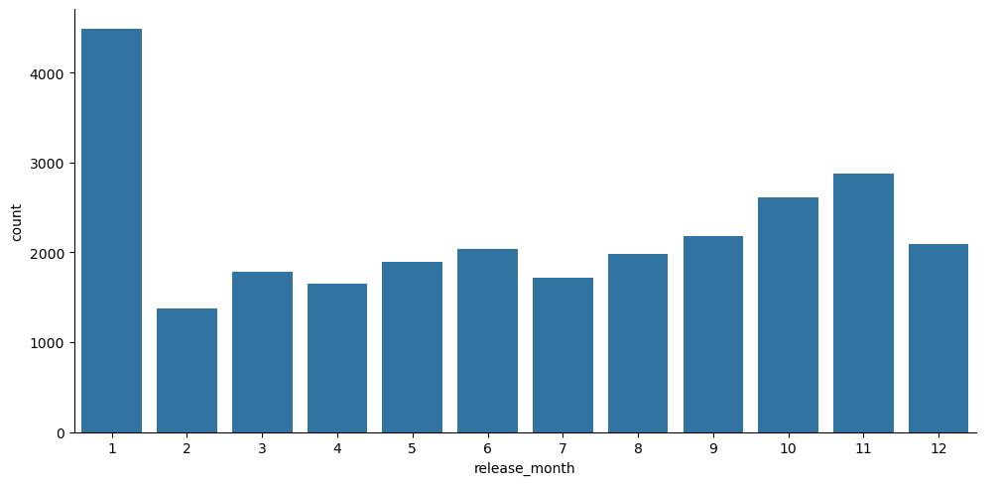

In [39]:
sns.catplot( data = df_clean, x='release_month', kind='count' , aspect = 2)

plt.show()

### f.	You must decide appropriate visualizations to show: 

#### i.	Categorical-to-categorical relationships (COMBINATIONS).

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


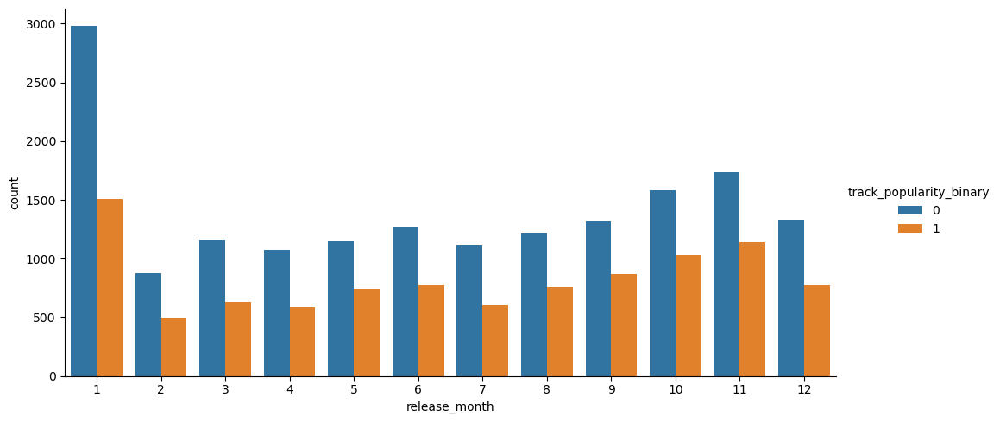

In [40]:
sns.catplot( data = df_clean, x='release_month', hue='track_popularity_binary', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


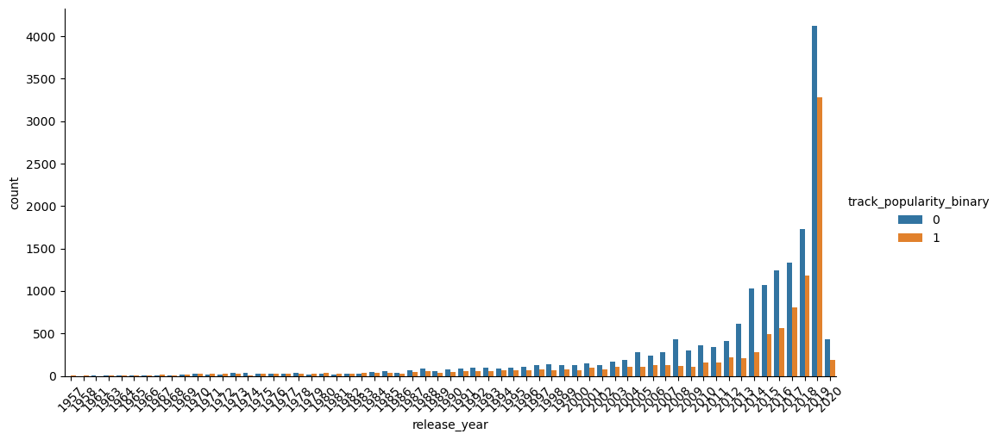

In [41]:
f = sns.catplot(data=df_clean, x='release_year', hue='track_popularity_binary', kind='count', aspect=2)
f.set_xticklabels(rotation=45)  
plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


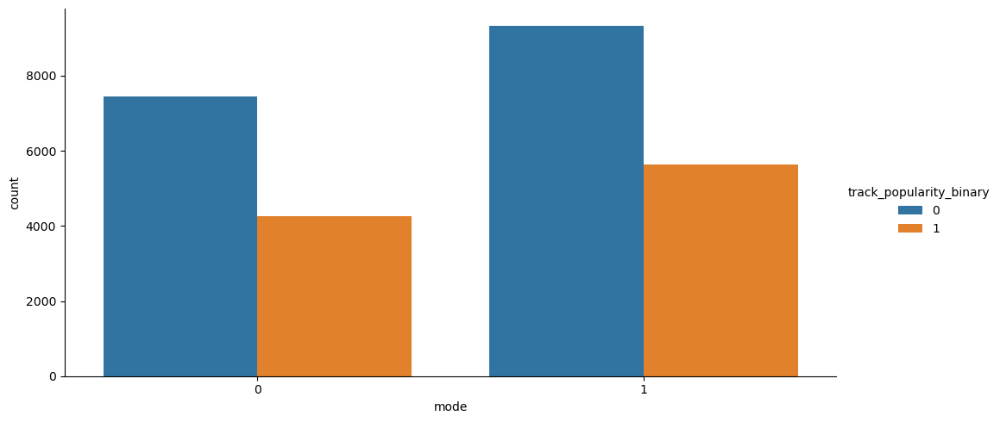

In [42]:
sns.catplot( data = df_clean, x='mode', hue='track_popularity_binary', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


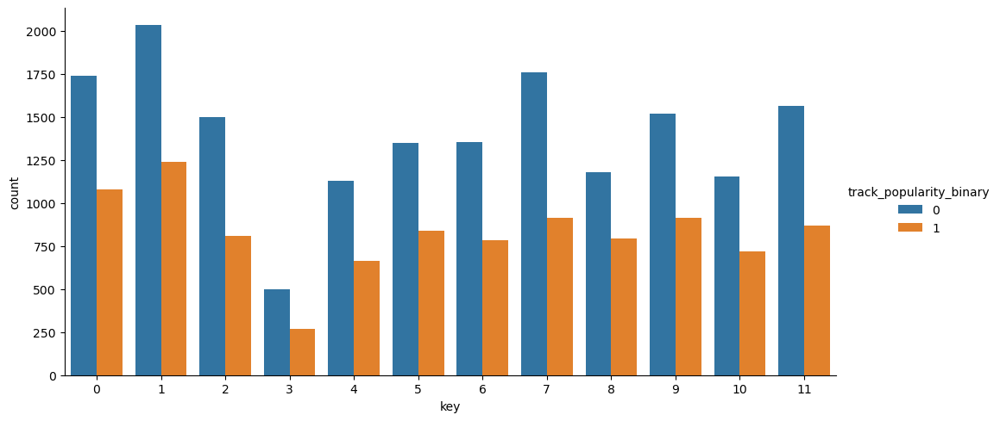

In [43]:
sns.catplot( data = df_clean, x='key', hue='track_popularity_binary', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


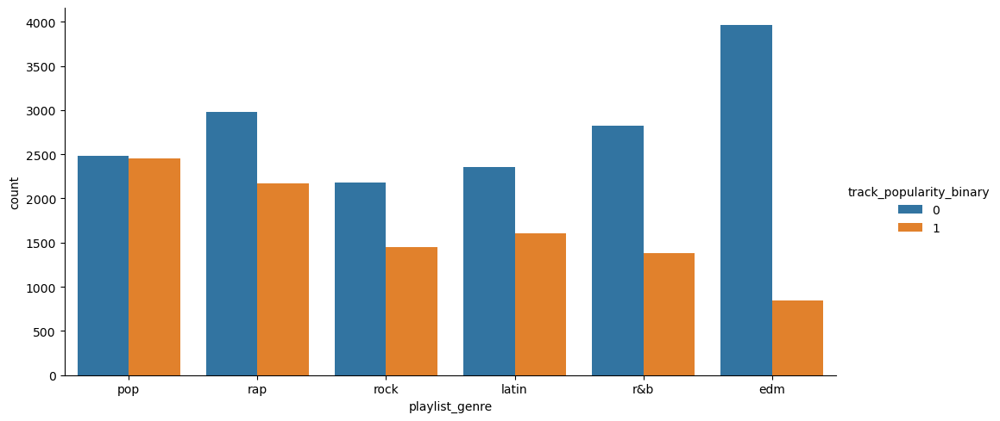

In [44]:
sns.catplot( data = df_clean, x='playlist_genre', hue='track_popularity_binary', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


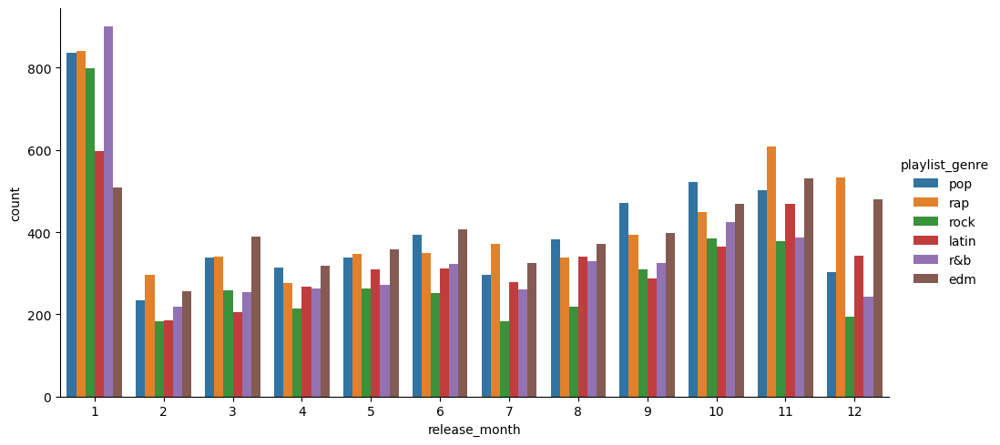

In [45]:
sns.catplot( data = df_clean, x='release_month', hue='playlist_genre', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


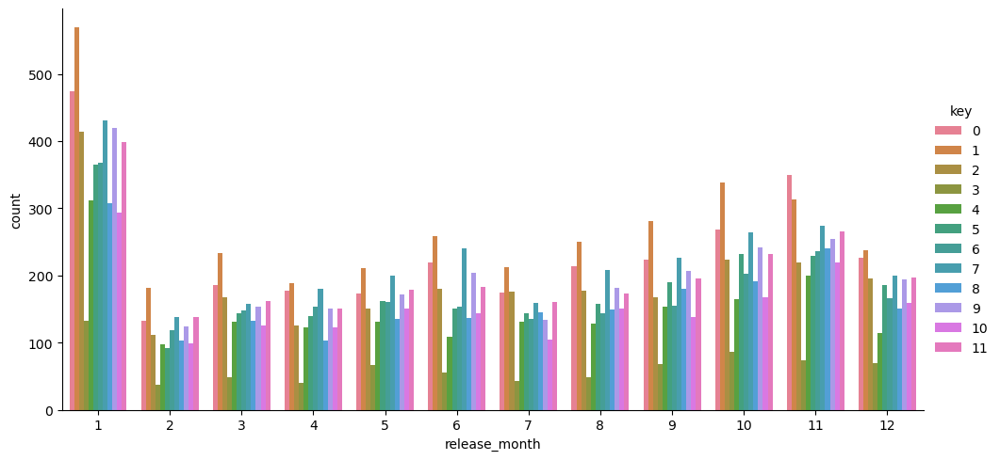

In [46]:
sns.catplot( data = df_clean, x='release_month', hue='key', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


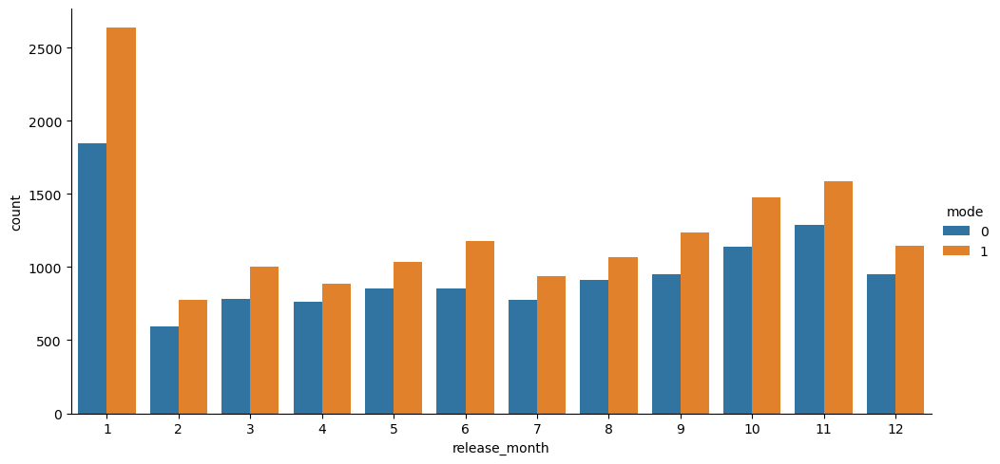

In [47]:
sns.catplot( data = df_clean, x='release_month', hue='mode', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


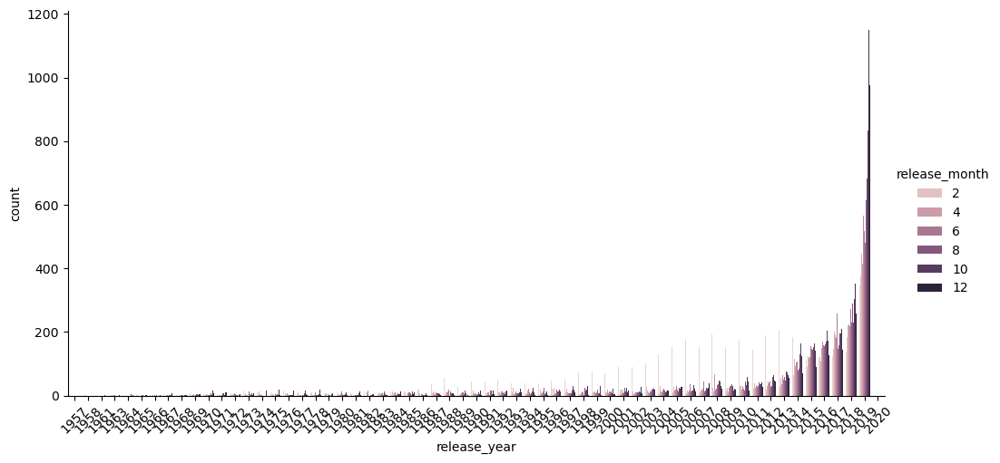

In [48]:
h = sns.catplot( data = df_clean, x='release_year', hue='release_month', kind='count', aspect = 2 )
h.set_xticklabels(rotation=45)
plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


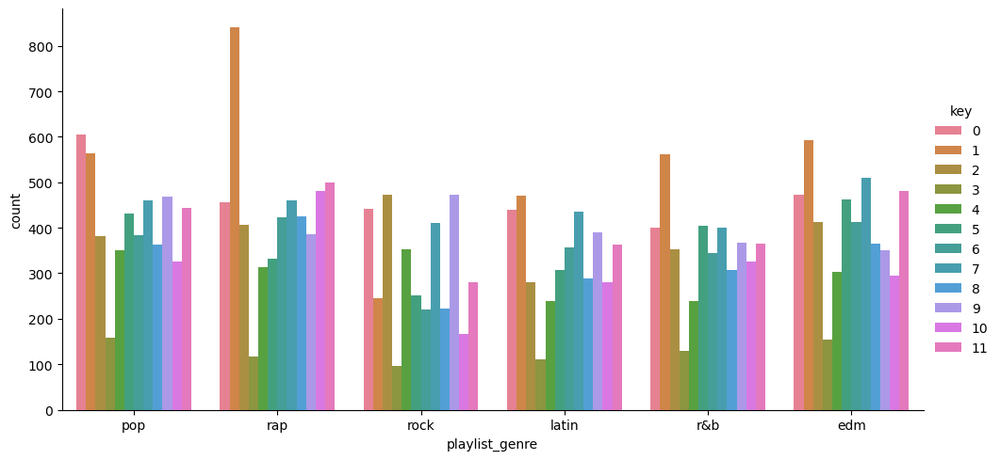

In [49]:
sns.catplot( data = df_clean, x='playlist_genre', hue='key', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


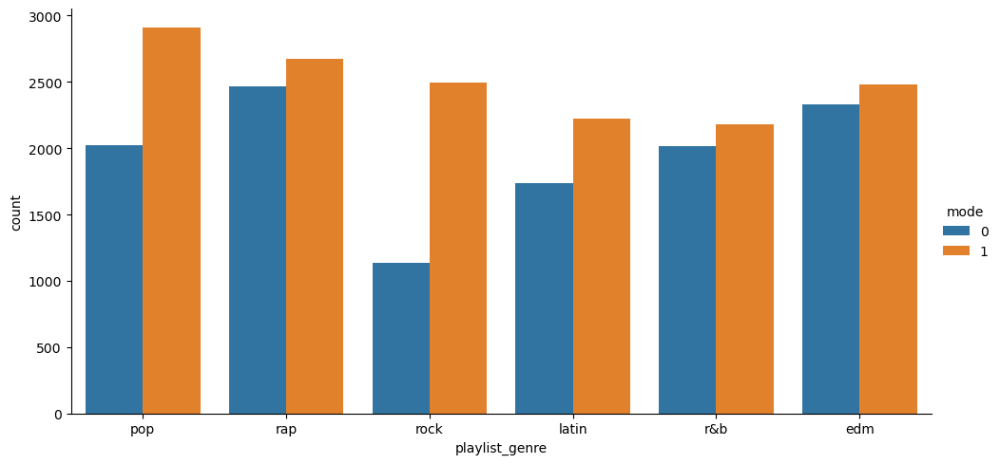

In [50]:
sns.catplot( data = df_clean, x='playlist_genre', hue='mode', kind='count', aspect = 2 )

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


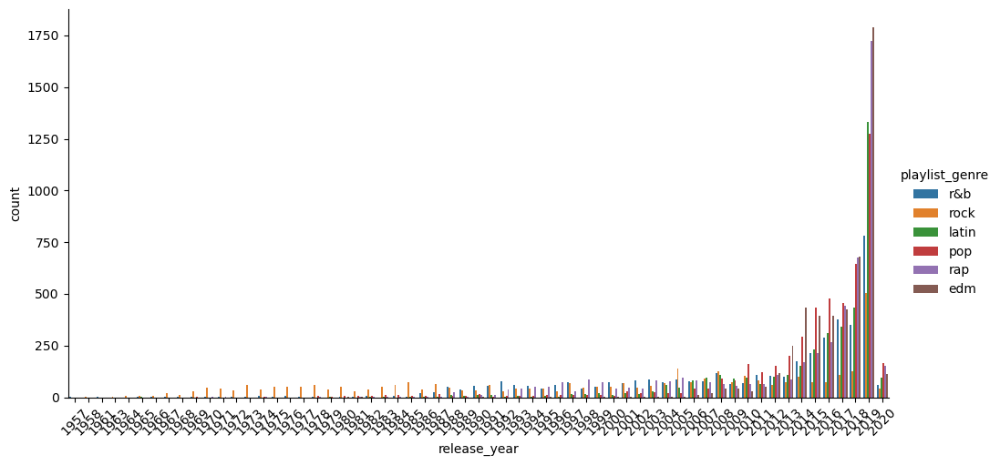

In [51]:
j = sns.catplot( data = df_clean, x='release_year', hue='playlist_genre', kind='count', aspect = 2 )
j.set_xticklabels(rotation=45)
plt.show()

#### ii.	Categorical-to-continuous relationships.

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


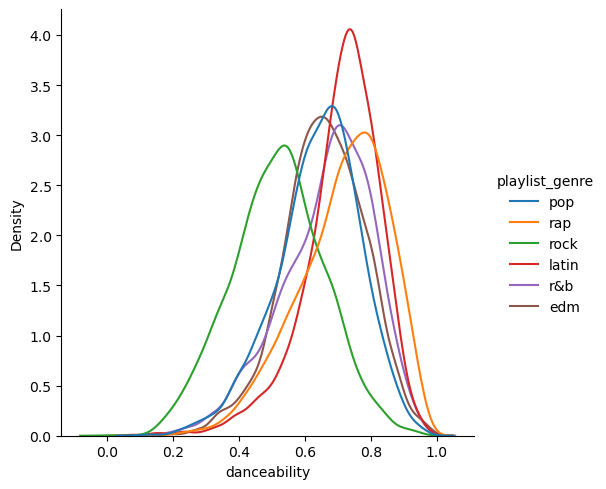

In [52]:
sns.displot(data = df_clean, x='danceability', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


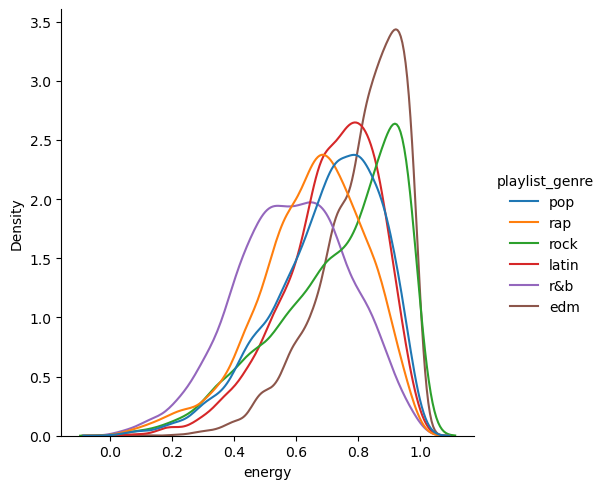

In [53]:
sns.displot(data = df_clean, x='energy', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


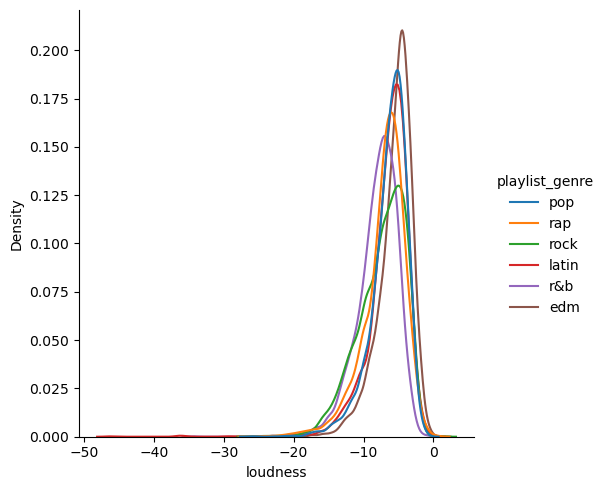

In [54]:
sns.displot(data = df_clean, x='loudness', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


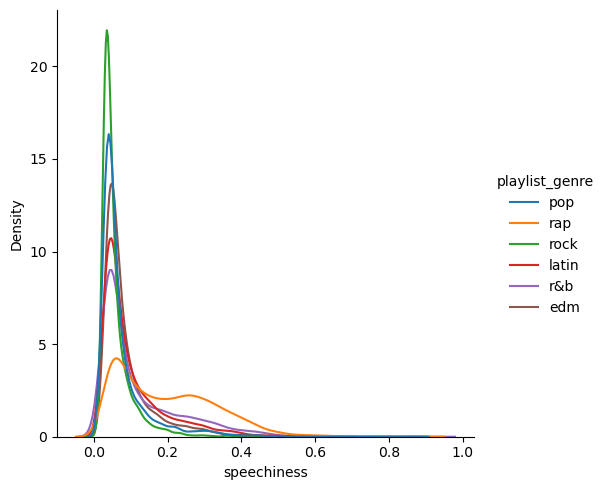

In [55]:
sns.displot(data = df_clean, x='speechiness', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


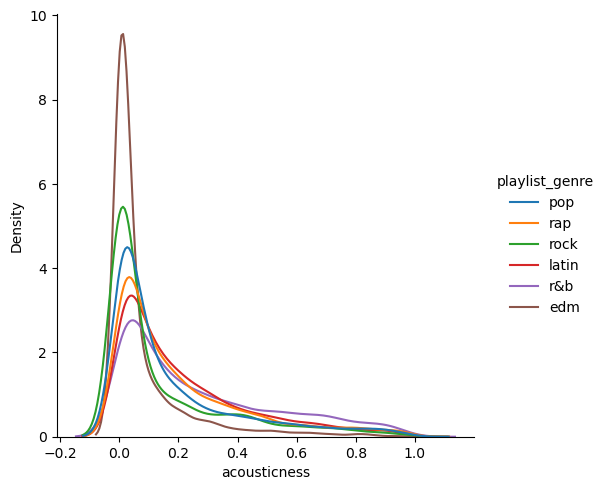

In [56]:
sns.displot(data = df_clean, x='acousticness', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


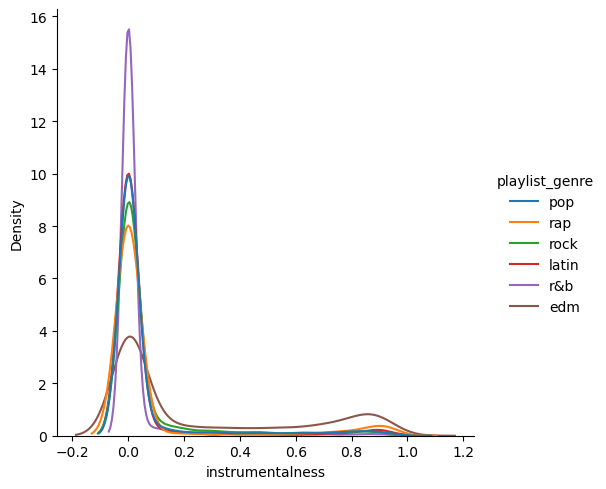

In [57]:
sns.displot(data = df_clean, x='instrumentalness', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


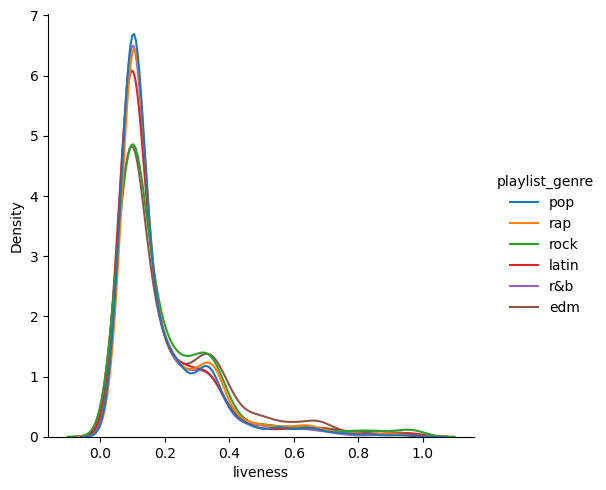

In [58]:
sns.displot(data = df_clean, x='liveness', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


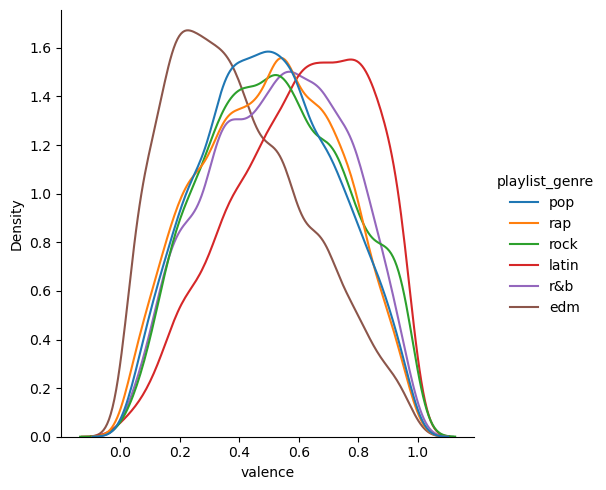

In [59]:
sns.displot(data = df_clean, x='valence', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


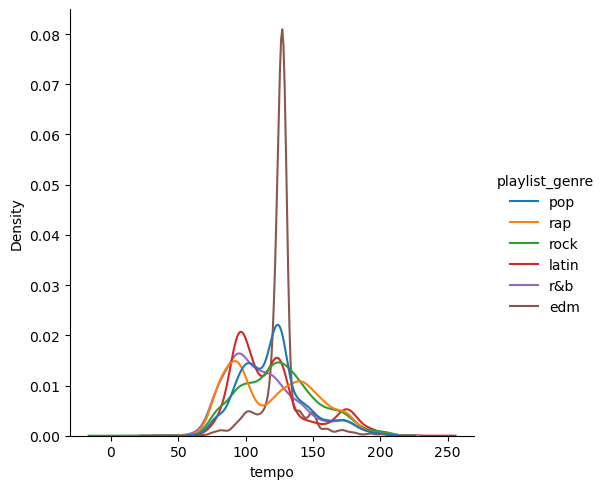

In [60]:
sns.displot(data = df_clean, x='tempo', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


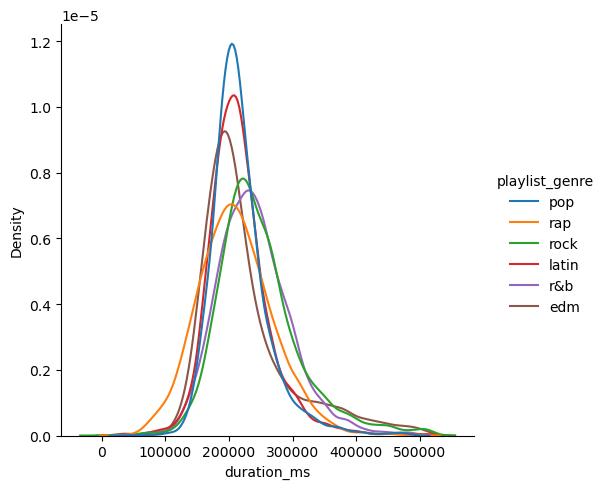

In [61]:
sns.displot(data = df_clean, x='duration_ms', hue='playlist_genre',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


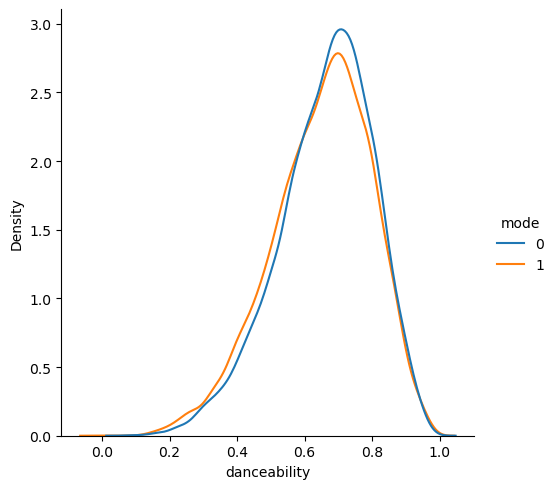

In [62]:
sns.displot(data = df_clean, x='danceability', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


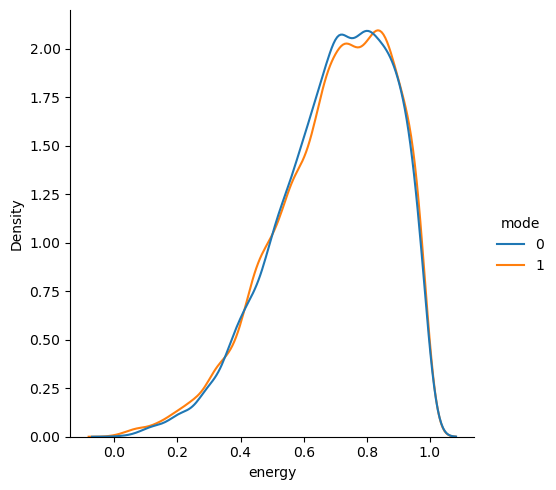

In [63]:
sns.displot(data = df_clean, x='energy', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


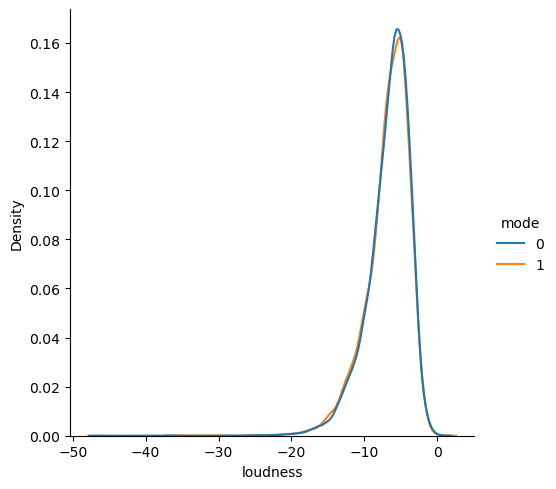

In [64]:
sns.displot(data = df_clean, x='loudness', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


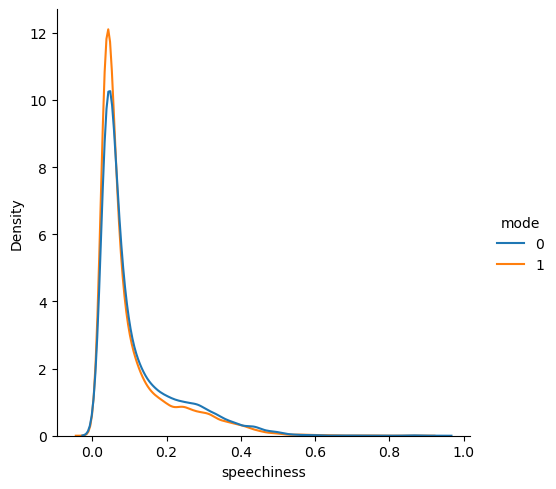

In [65]:
sns.displot(data = df_clean, x='speechiness', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


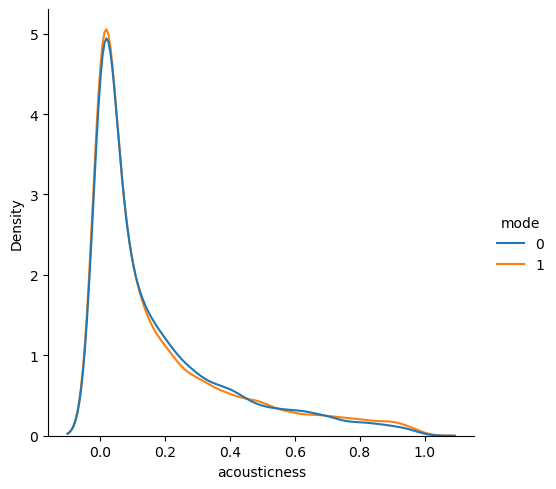

In [66]:
sns.displot(data = df_clean, x='acousticness', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


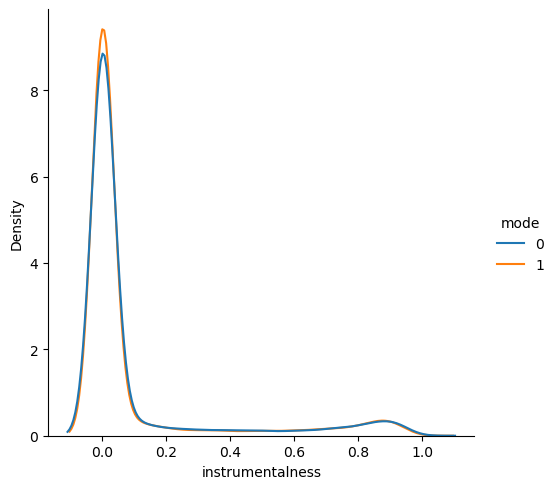

In [67]:
sns.displot(data = df_clean, x='instrumentalness', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


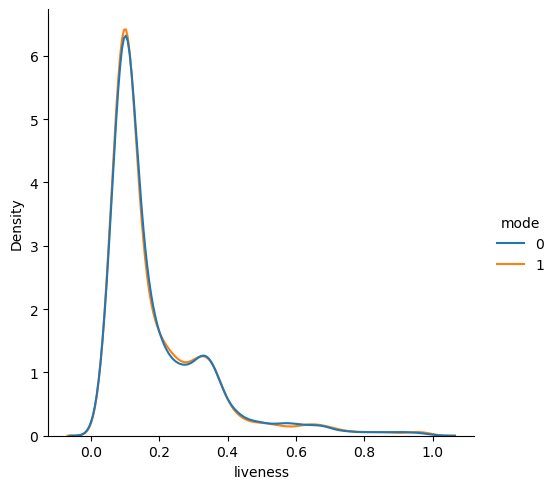

In [68]:
sns.displot(data = df_clean, x='liveness', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


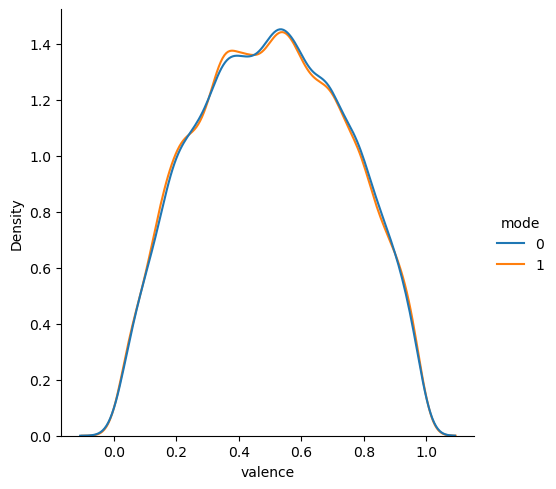

In [69]:
sns.displot(data = df_clean, x='valence', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


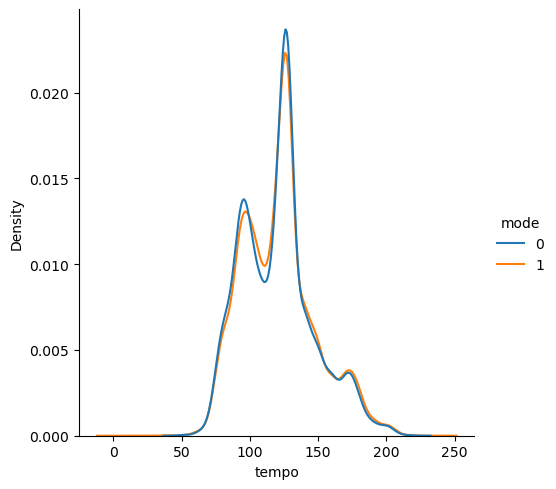

In [70]:
sns.displot(data = df_clean, x='tempo', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


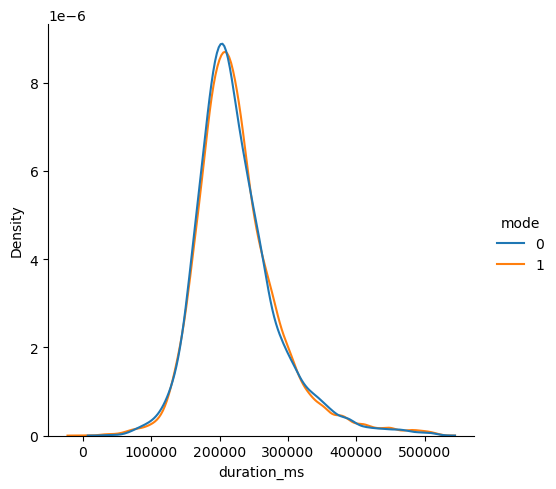

In [71]:
sns.displot(data = df_clean, x='duration_ms', hue='mode',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


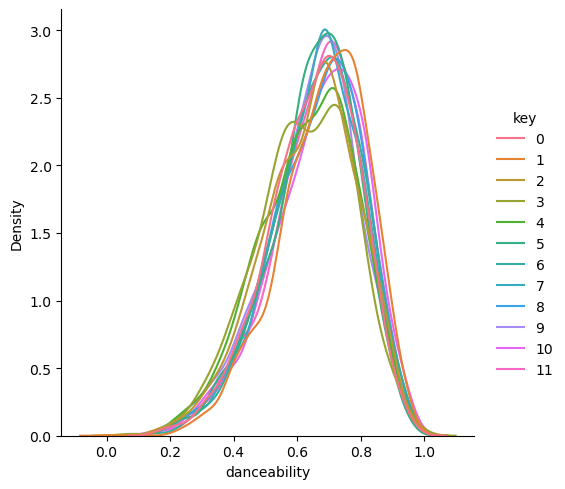

In [72]:
sns.displot(data = df_clean, x='danceability', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


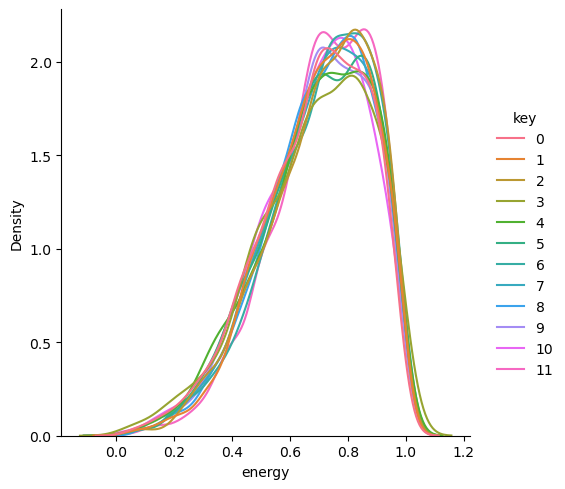

In [73]:
sns.displot(data = df_clean, x='energy', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


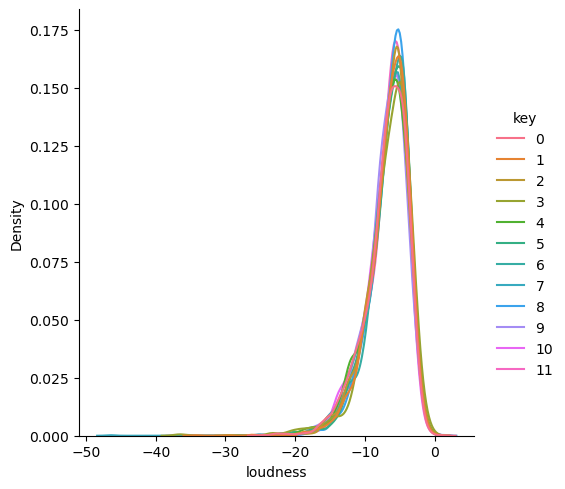

In [74]:
sns.displot(data = df_clean, x='loudness', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


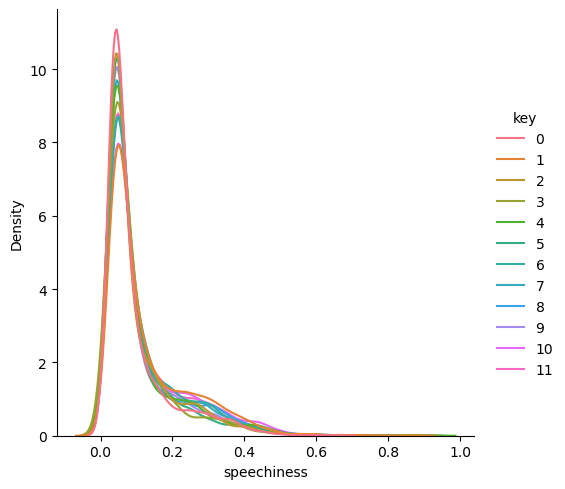

In [75]:
sns.displot(data = df_clean, x='speechiness', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


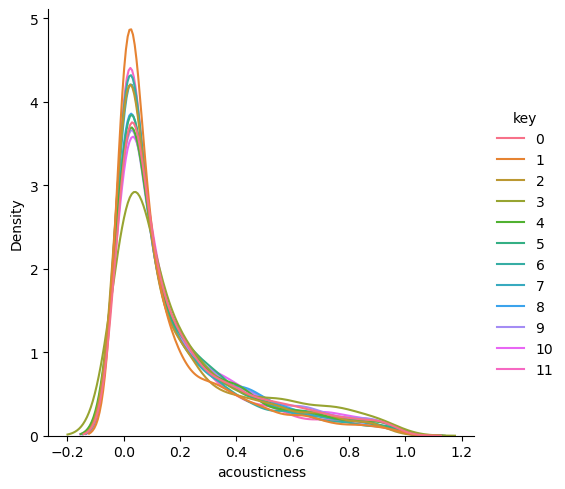

In [76]:
sns.displot(data = df_clean, x='acousticness', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


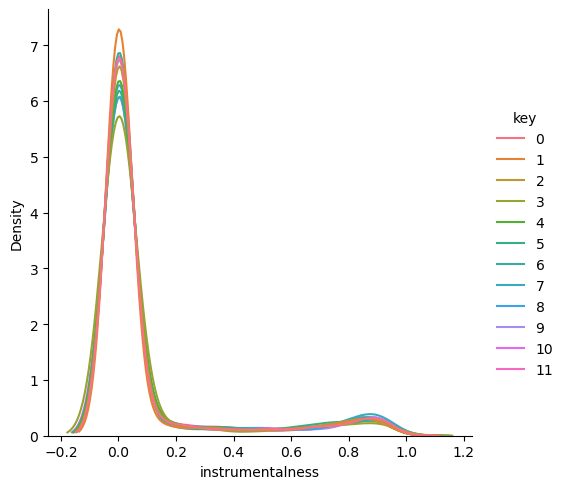

In [77]:
sns.displot(data = df_clean, x='instrumentalness', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


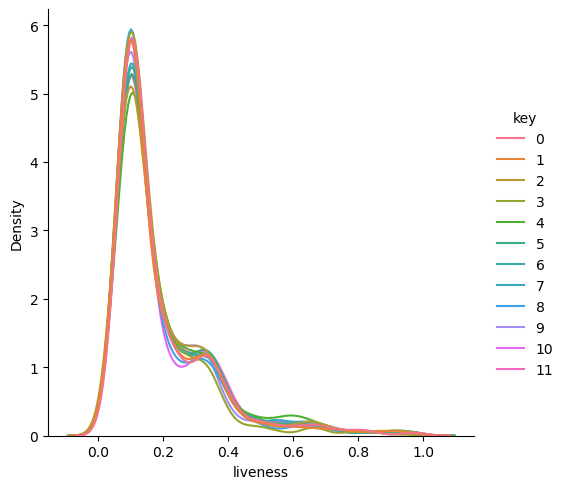

In [78]:
sns.displot(data = df_clean, x='liveness', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


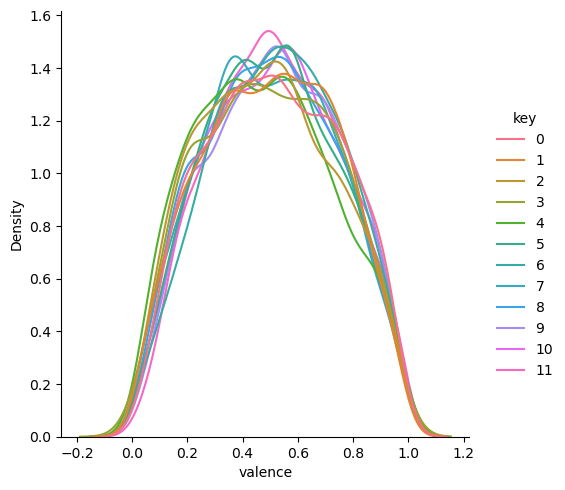

In [79]:
sns.displot(data = df_clean, x='valence', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


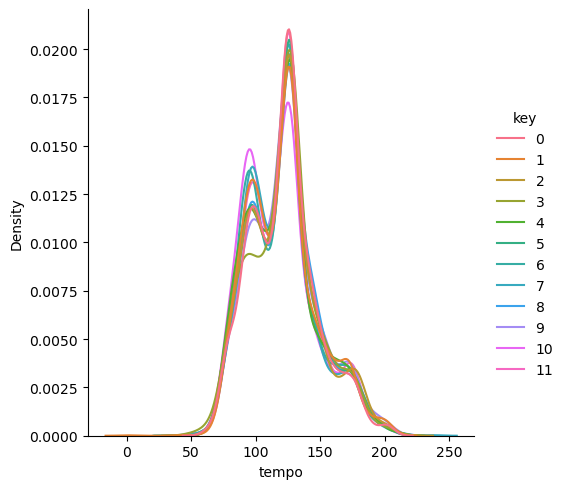

In [80]:
sns.displot(data = df_clean, x='tempo', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


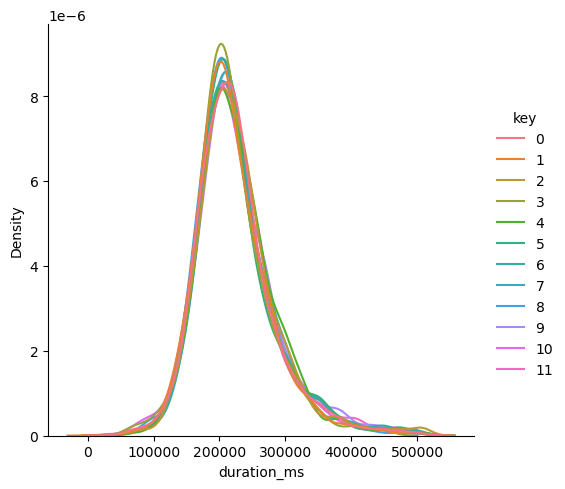

In [81]:
sns.displot(data = df_clean, x='duration_ms', hue='key',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\2454955357.py:3: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data=df_clean, x='danceability', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


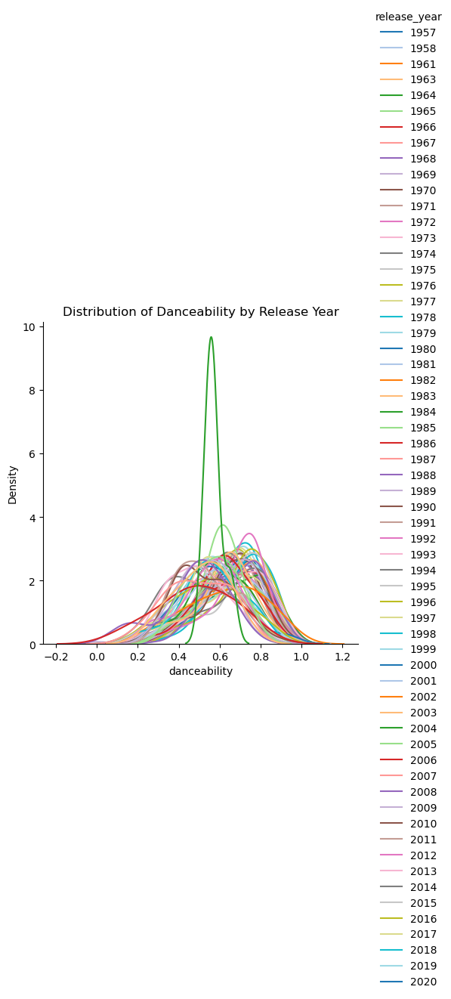

In [82]:
cmap = sns.color_palette("tab20", as_cmap=True)

sns.displot(data=df_clean, x='danceability', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.title('Distribution of Danceability by Release Year')
plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\3026997208.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='energy', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


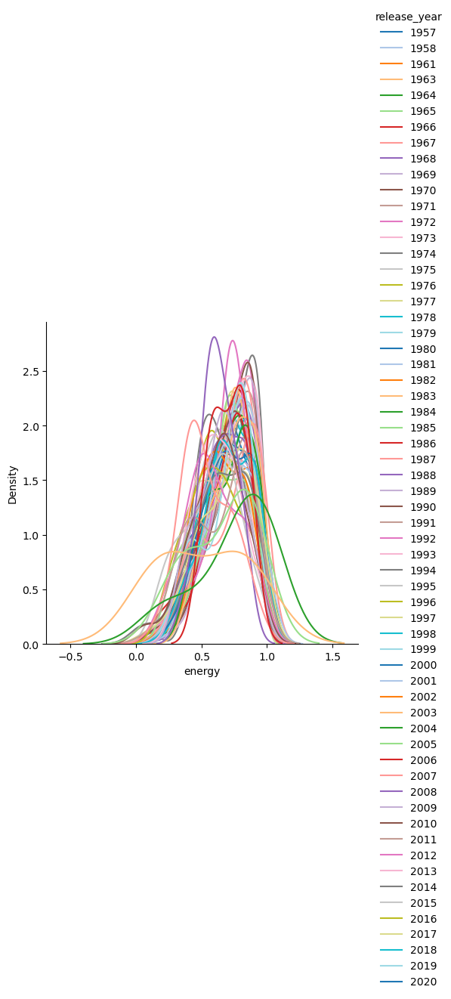

In [83]:
sns.displot(data = df_clean, x='energy', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\3732591233.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='loudness', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


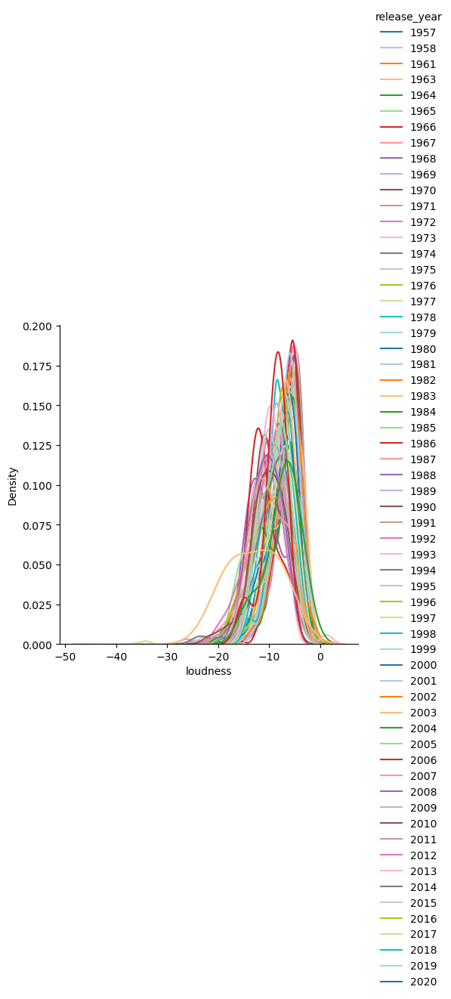

In [84]:
sns.displot(data = df_clean, x='loudness', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\2876717580.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='speechiness', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


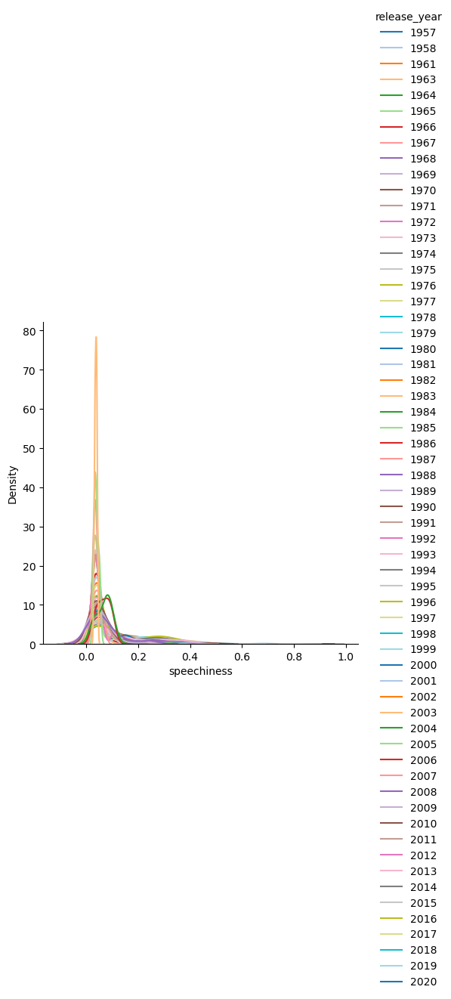

In [85]:
sns.displot(data = df_clean, x='speechiness', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\3339679163.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='acousticness', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


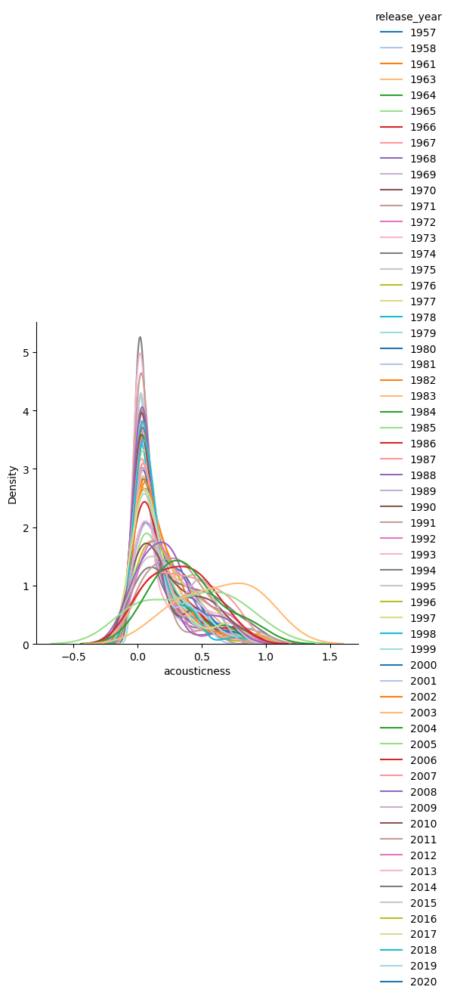

In [86]:
sns.displot(data = df_clean, x='acousticness', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\2822120908.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='instrumentalness', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


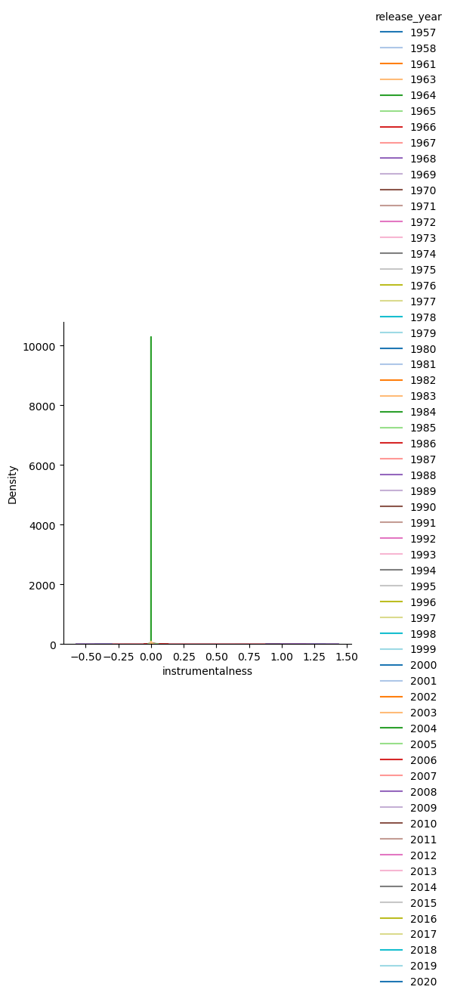

In [87]:
sns.displot(data = df_clean, x='instrumentalness', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\1000003954.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='liveness', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


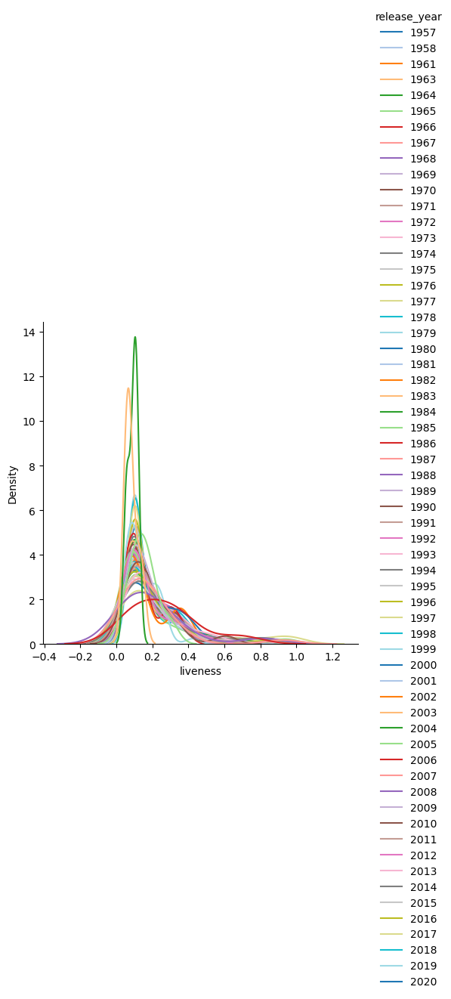

In [88]:
sns.displot(data = df_clean, x='liveness', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\2449192625.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='valence', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


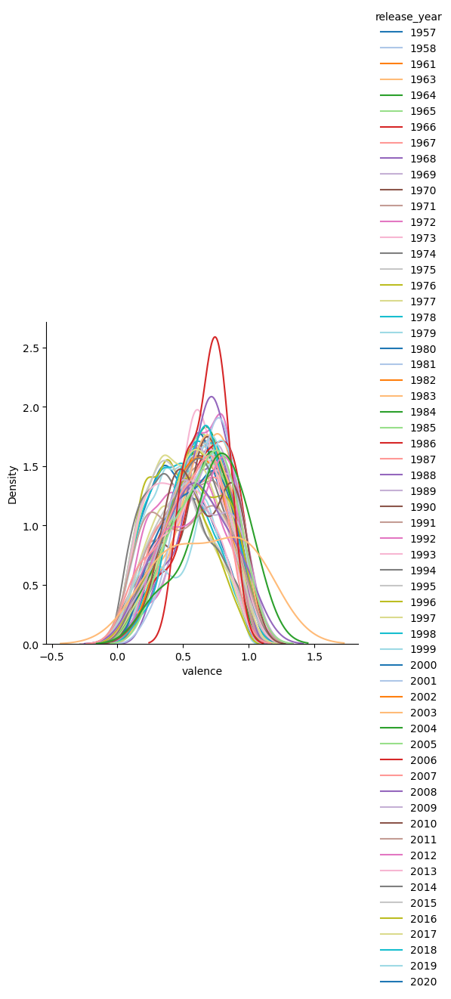

In [89]:
sns.displot(data = df_clean, x='valence', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\4216906255.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='tempo', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


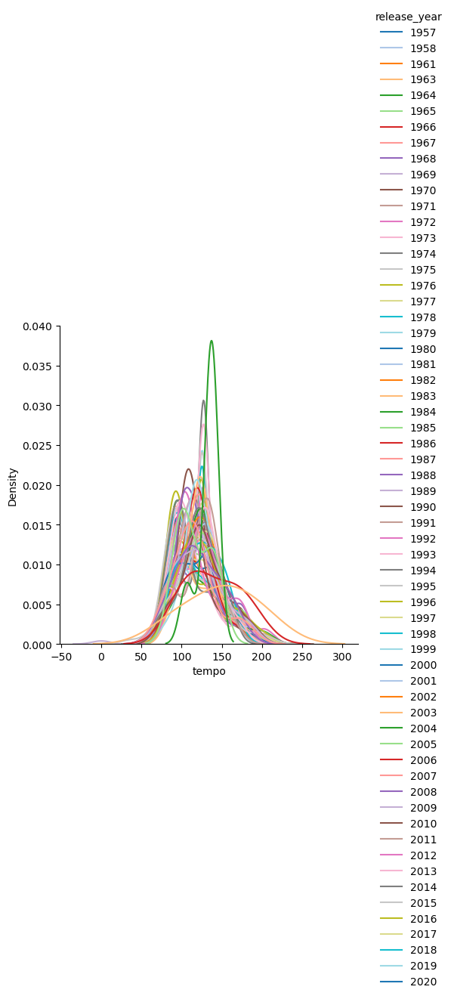

In [90]:
sns.displot(data = df_clean, x='tempo', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\AppData\Local\Temp\ipykernel_428\2447598573.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data = df_clean, x='duration_ms', hue='release_year',
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


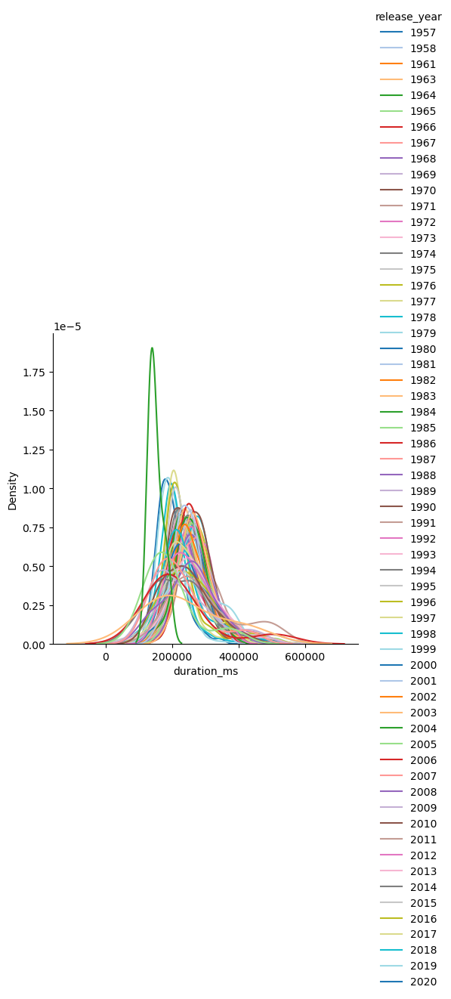

In [91]:
sns.displot(data = df_clean, x='duration_ms', hue='release_year',
            common_norm=False, kind='kde', palette='tab20')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


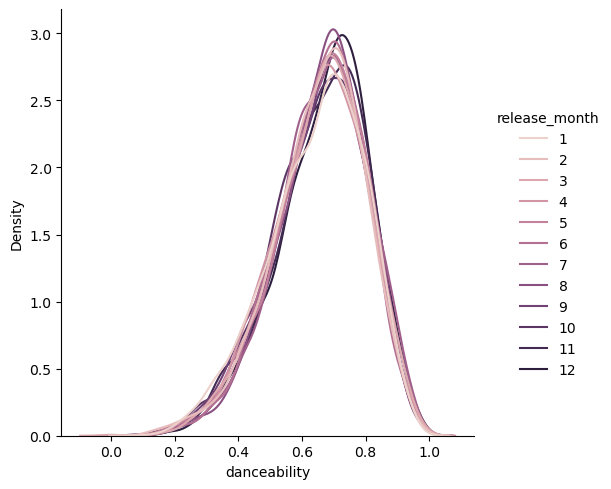

In [92]:
sns.displot(data = df_clean, x='danceability', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


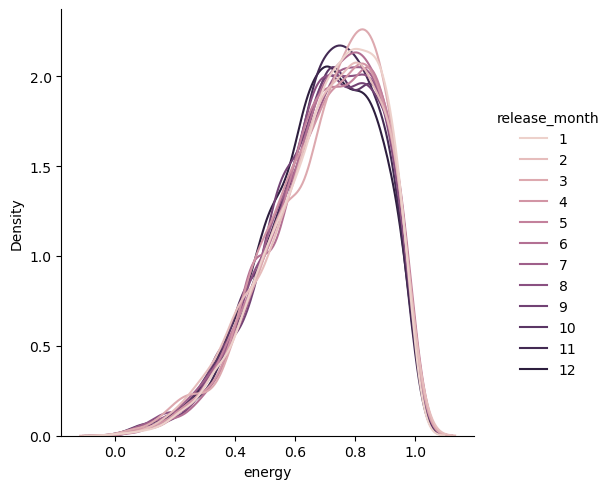

In [93]:
sns.displot(data = df_clean, x='energy', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


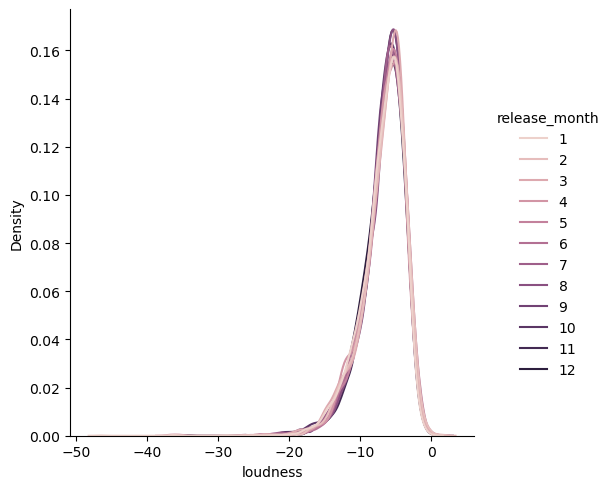

In [94]:
sns.displot(data = df_clean, x='loudness', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


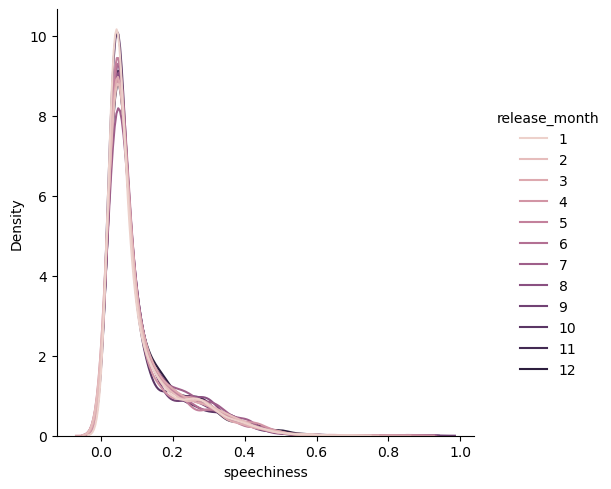

In [95]:
sns.displot(data = df_clean, x='speechiness', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


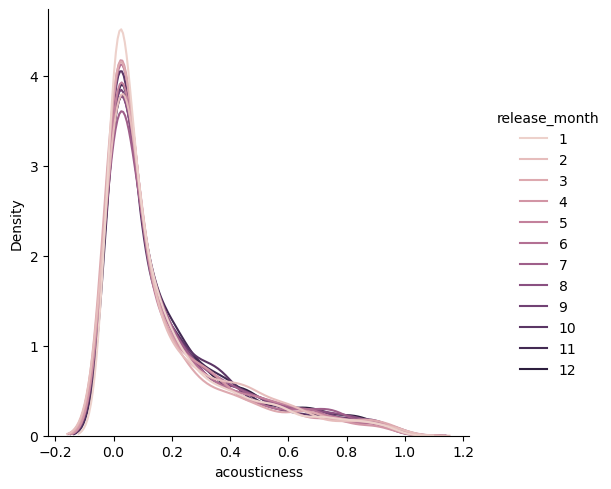

In [96]:
sns.displot(data = df_clean, x='acousticness', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


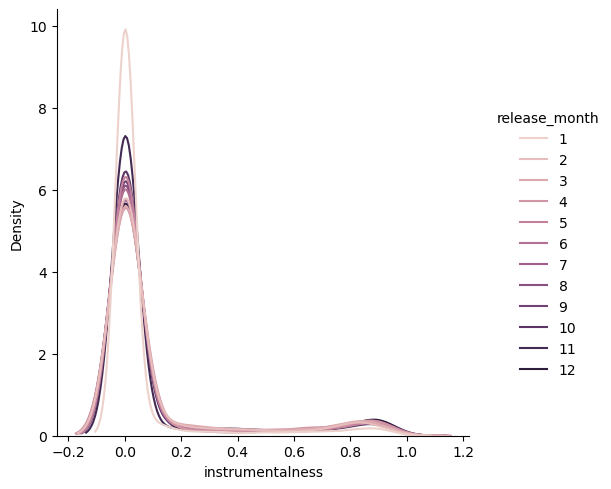

In [97]:
sns.displot(data = df_clean, x='instrumentalness', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


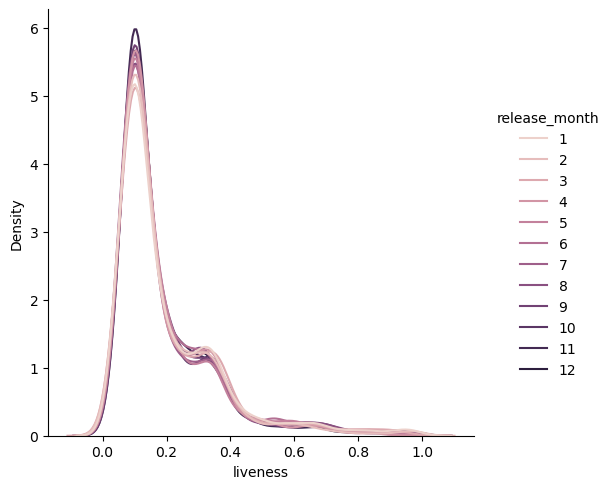

In [98]:
sns.displot(data = df_clean, x='liveness', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


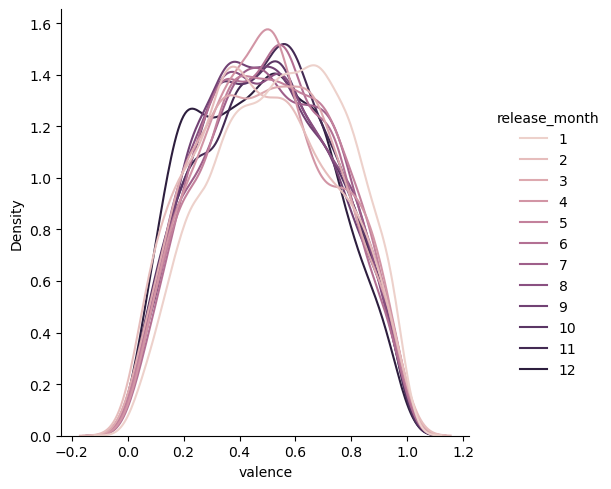

In [99]:
sns.displot(data = df_clean, x='valence', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


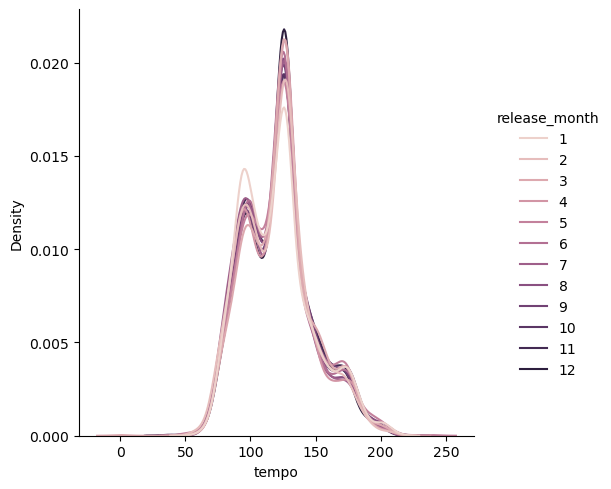

In [100]:
sns.displot(data = df_clean, x='tempo', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


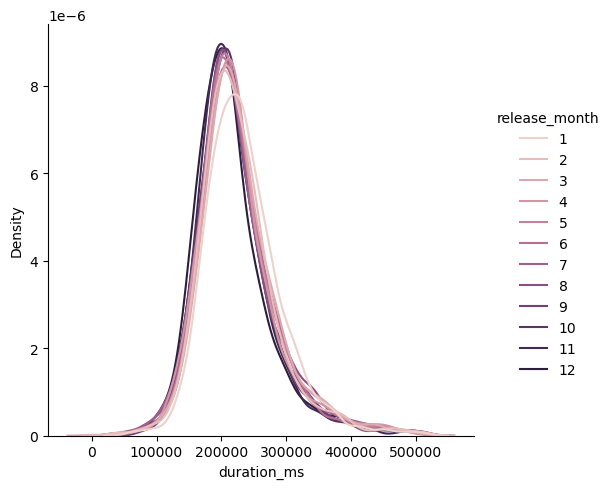

In [101]:
sns.displot(data = df_clean, x='duration_ms', hue='release_month',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


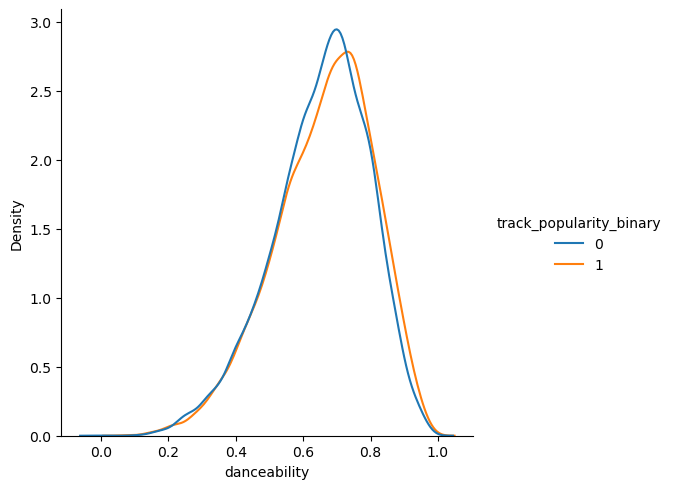

In [102]:
sns.displot(data = df_clean, x='danceability', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


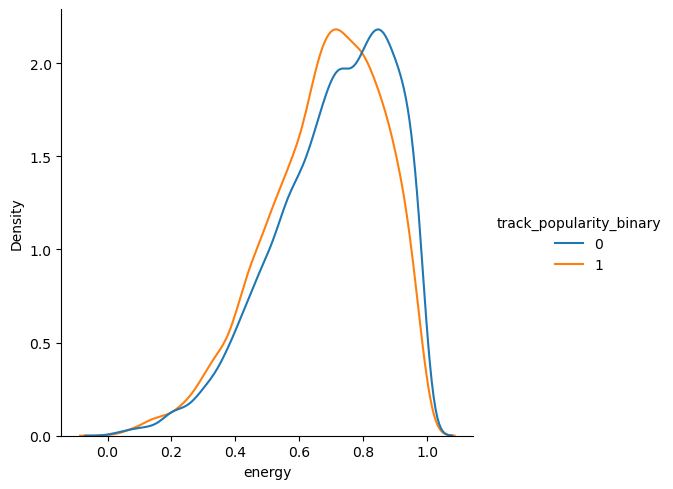

In [103]:
sns.displot(data = df_clean, x='energy', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


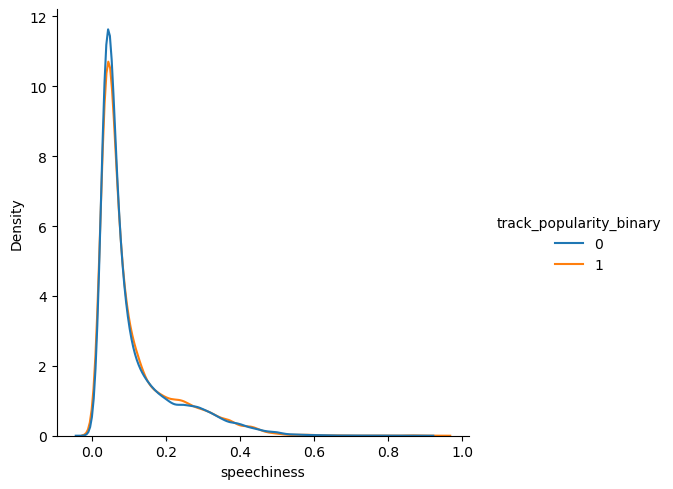

In [104]:
sns.displot(data = df_clean, x='speechiness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


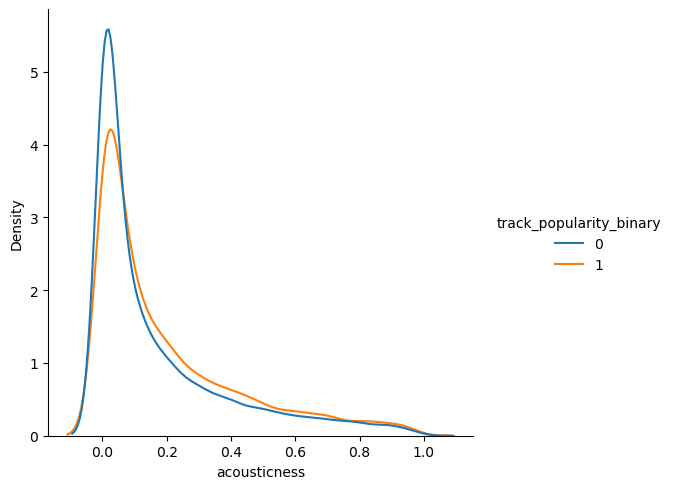

In [105]:
sns.displot(data = df_clean, x='acousticness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


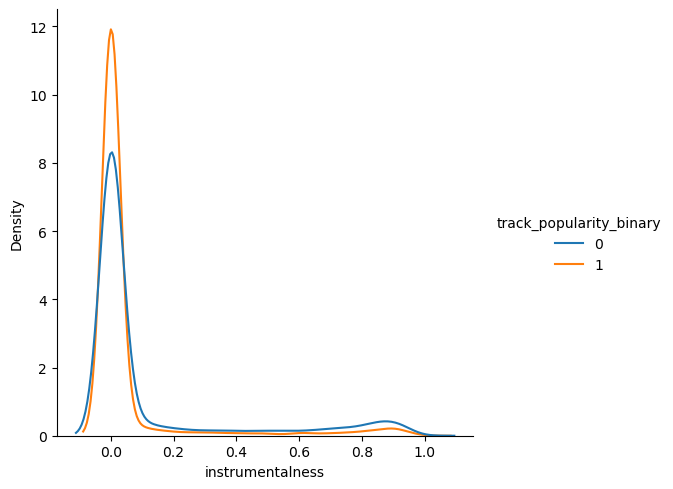

In [106]:
sns.displot(data = df_clean, x='instrumentalness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


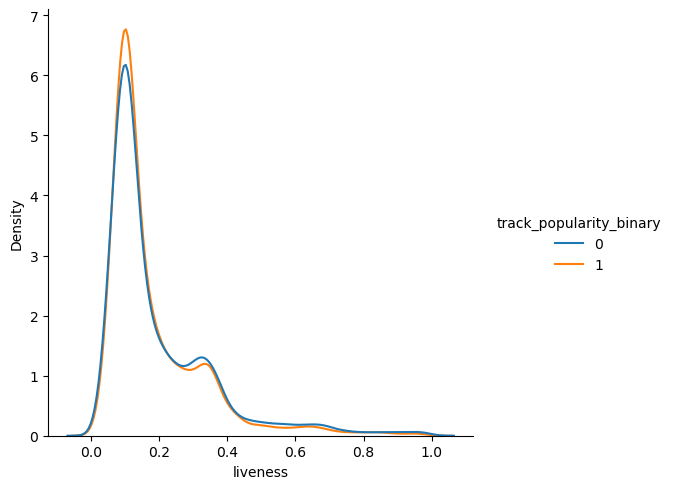

In [107]:
sns.displot(data = df_clean, x='liveness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


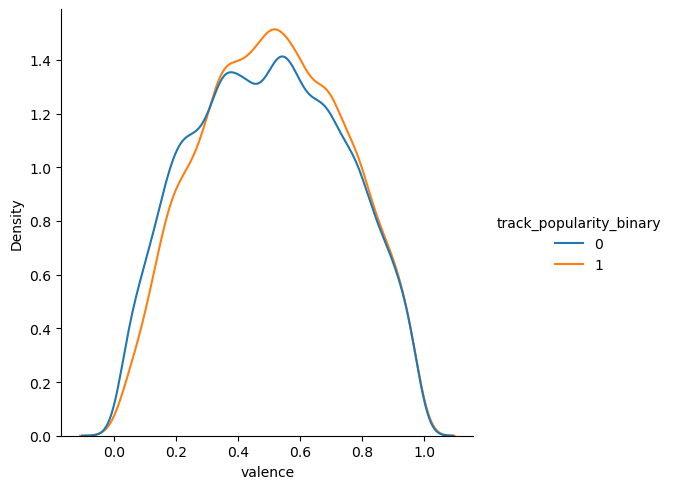

In [108]:
sns.displot(data = df_clean, x='valence', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


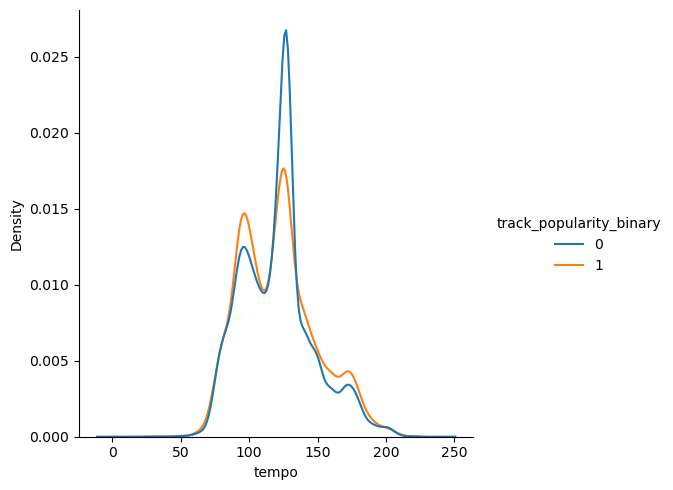

In [109]:
sns.displot(data = df_clean, x='tempo', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


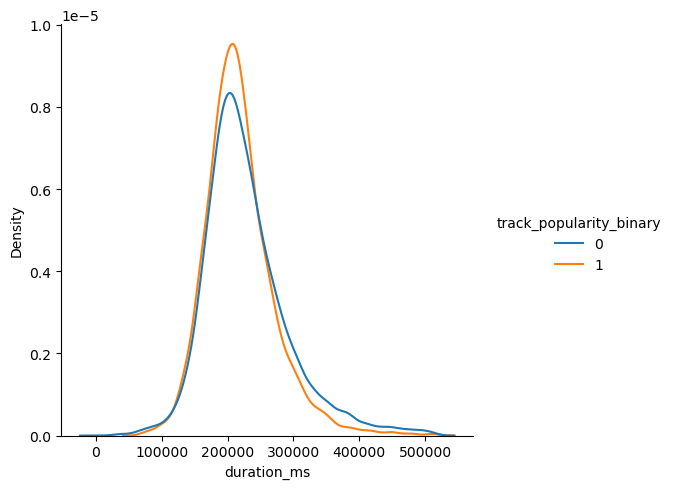

In [124]:
sns.displot(data = df_clean, x='duration_ms', hue='track_popularity_binary',
            common_norm=False, kind='kde')
plt.show()

#### iii.	Continuous-to-continuous relationships.

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


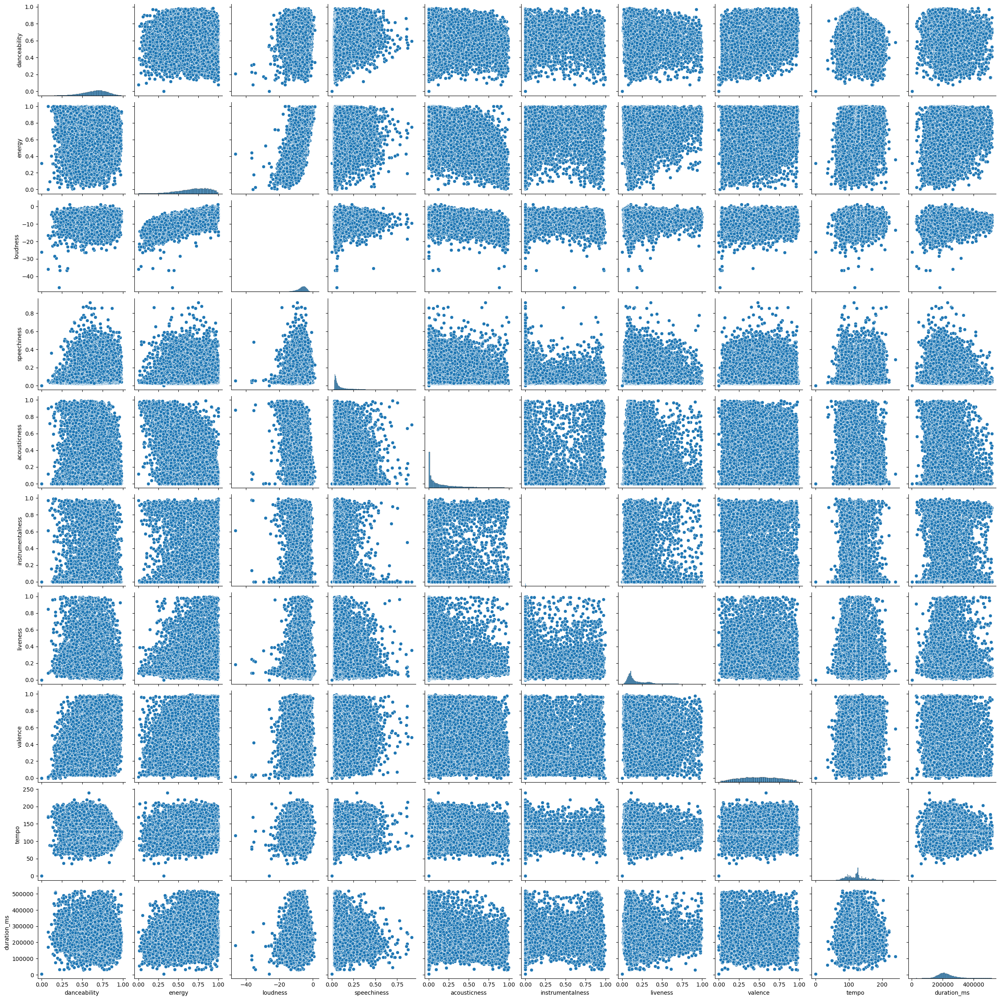

In [111]:
continuous_vars = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
                   'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

sns.pairplot(data=df_clean, vars=continuous_vars, diag_kws={'common_norm': False})
plt.show()

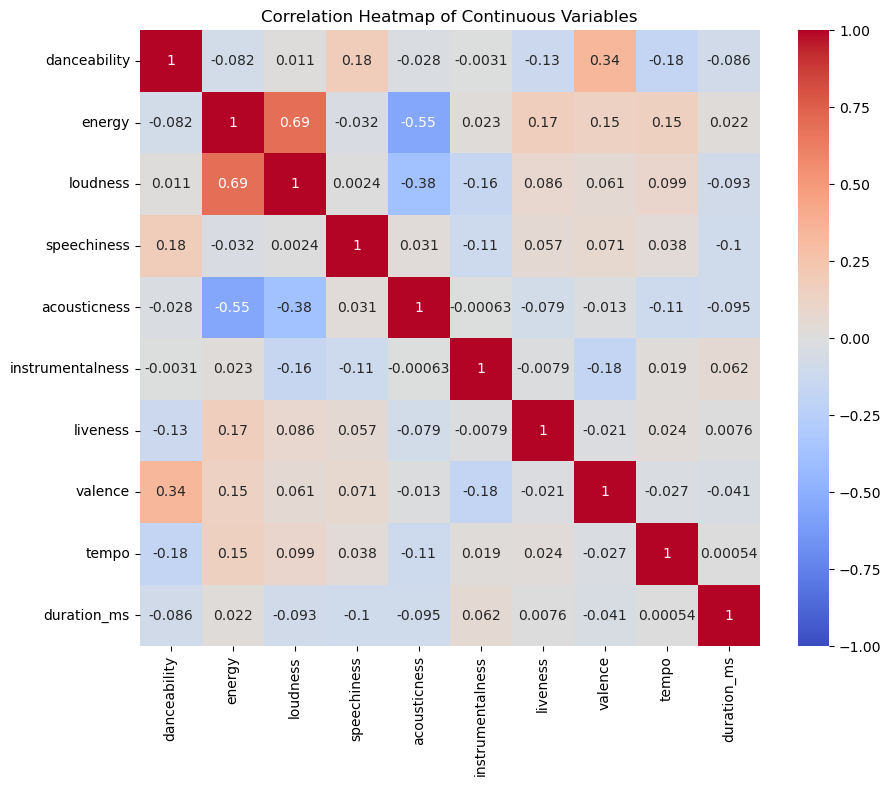

In [112]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(data=df_clean[continuous_vars].corr(), vmin=-1, vmax=1, center=0,
            cmap='coolwarm', annot=True, annot_kws={'size': 10}, ax=ax)
plt.title("Correlation Heatmap of Continuous Variables")
plt.show()

### g.	You must decide appropriate visualizations to show if RELATIONSHIPS change across GROUPS. This is especially important to continuous-to-continuous relationships. Do not forget though that categorical-to-continuous relationships can also be GROUPED BY a secondary categorical variable!

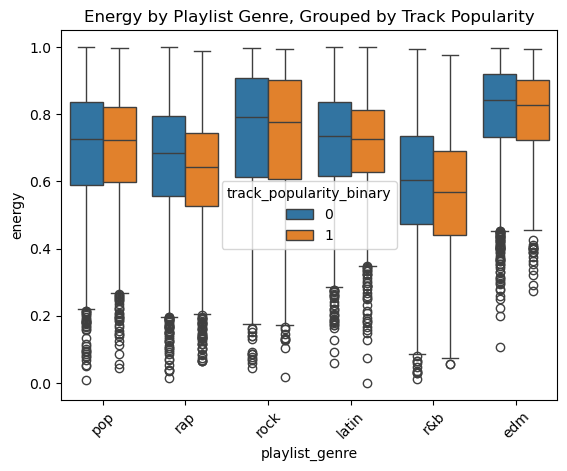

In [119]:
sns.boxplot(data=df_clean, x='playlist_genre', y='energy', hue='track_popularity_binary')
plt.xticks(rotation=45)
plt.title("Energy by Playlist Genre, Grouped by Track Popularity")
plt.show()

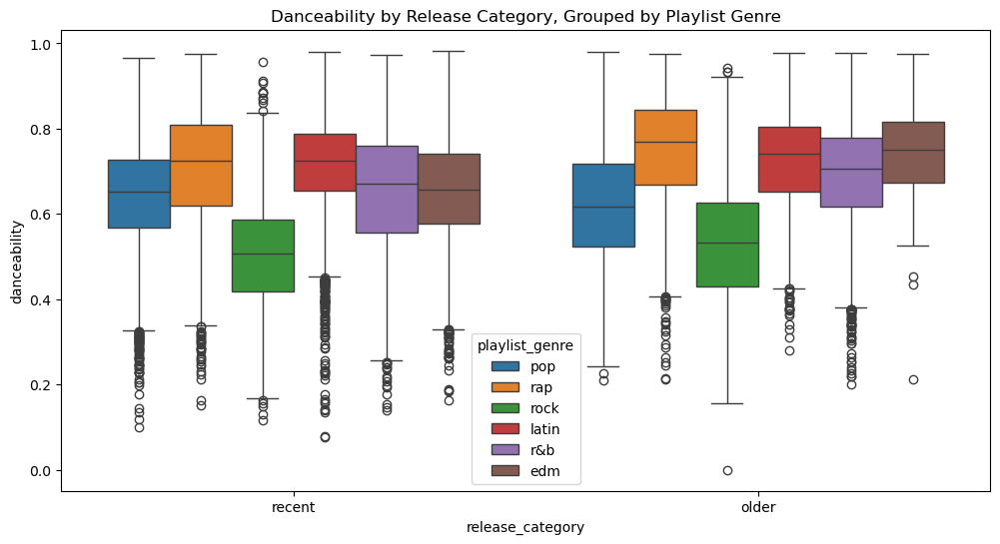

In [123]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_clean, x='release_category', y='danceability', hue='playlist_genre')
plt.title("Danceability by Release Category, Grouped by Playlist Genre")
plt.show()

### i.	If you are working on a CLASSIFICATION problem, you must: 

#### i.	Visualize conditional distributions of the continuous inputs GROUPED BY the response (outcome) unique values.

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


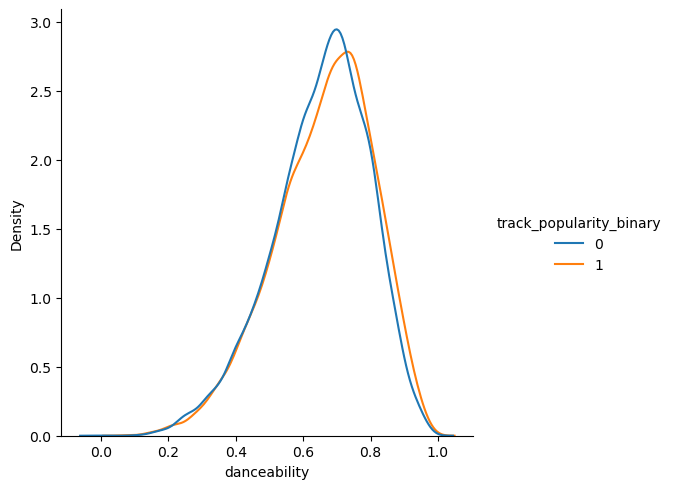

In [125]:
sns.displot(data = df_clean, x='danceability', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


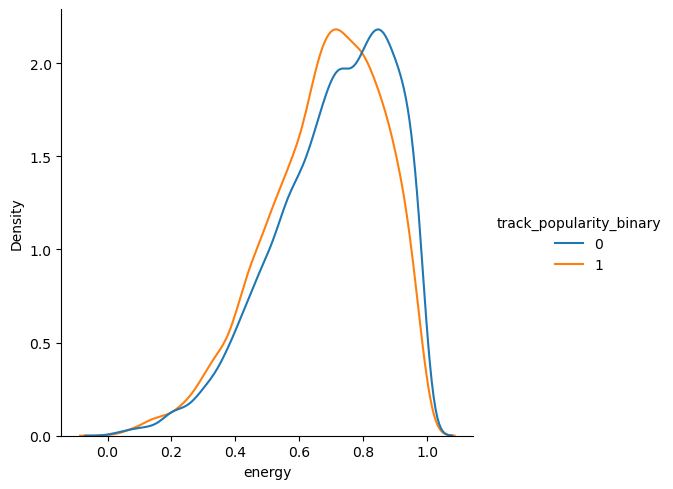

In [126]:
sns.displot(data = df_clean, x='energy', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


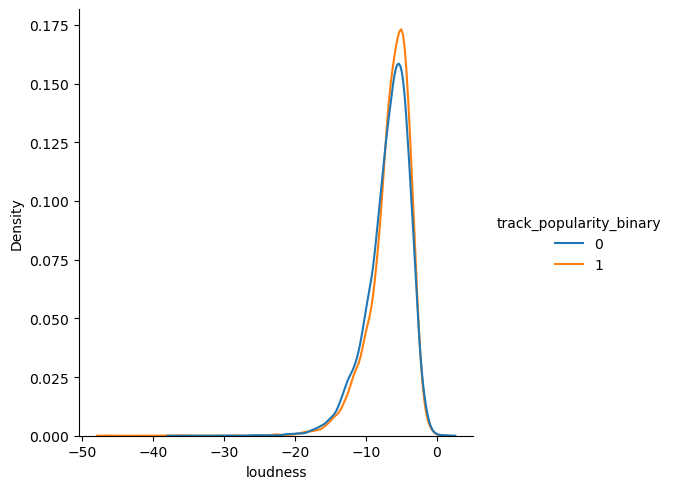

In [127]:
sns.displot(data = df_clean, x='loudness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


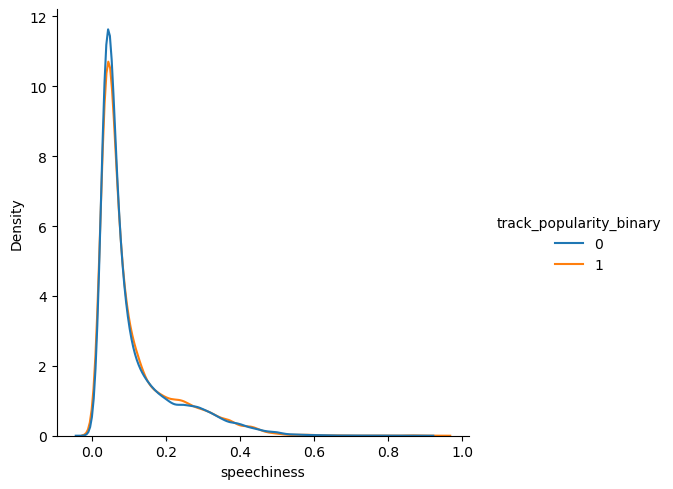

In [128]:
sns.displot(data = df_clean, x='speechiness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


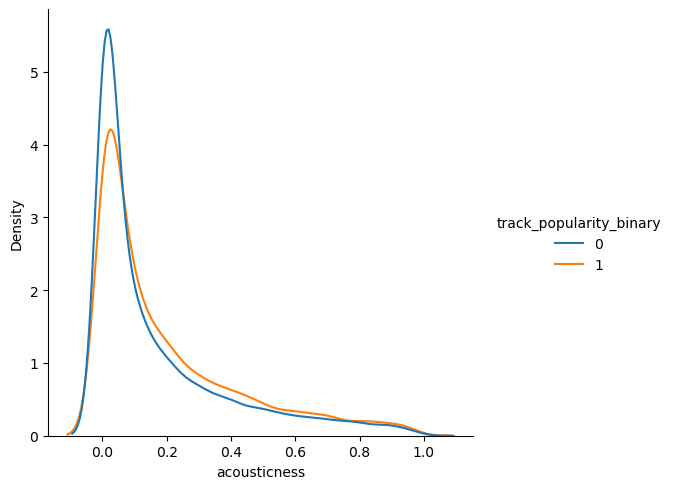

In [129]:
sns.displot(data = df_clean, x='acousticness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


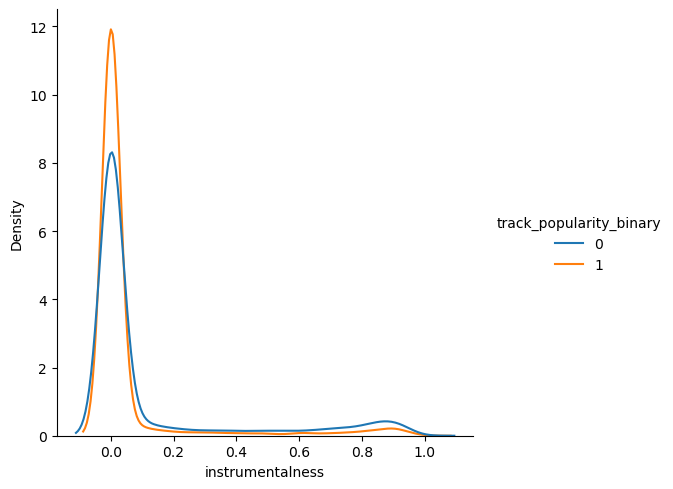

In [130]:
sns.displot(data = df_clean, x='instrumentalness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


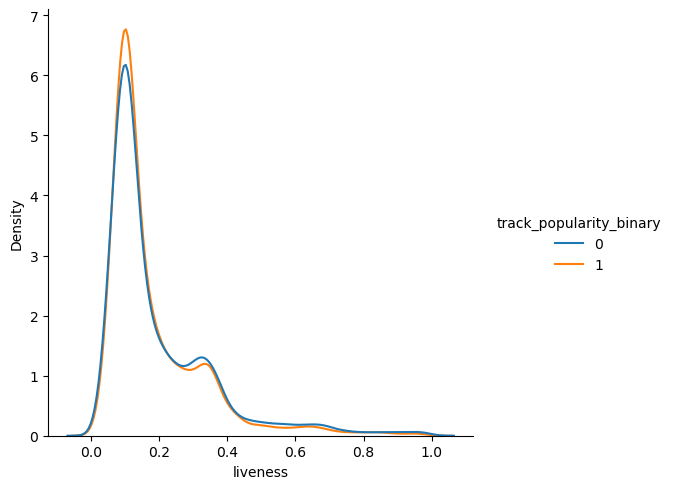

In [131]:
sns.displot(data = df_clean, x='liveness', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


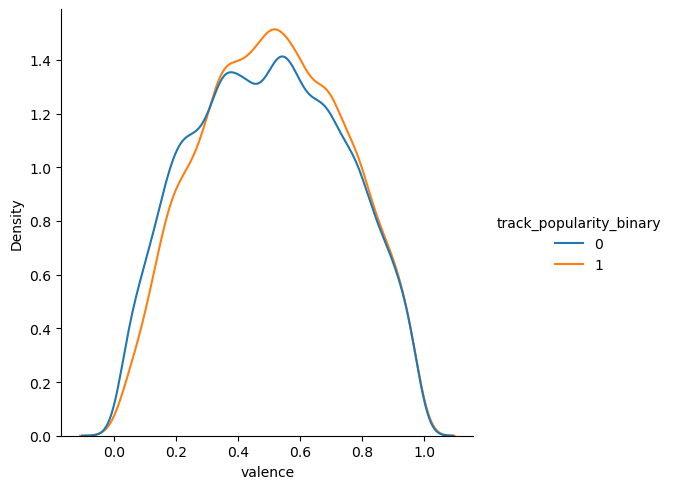

In [132]:
sns.displot(data = df_clean, x='valence', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


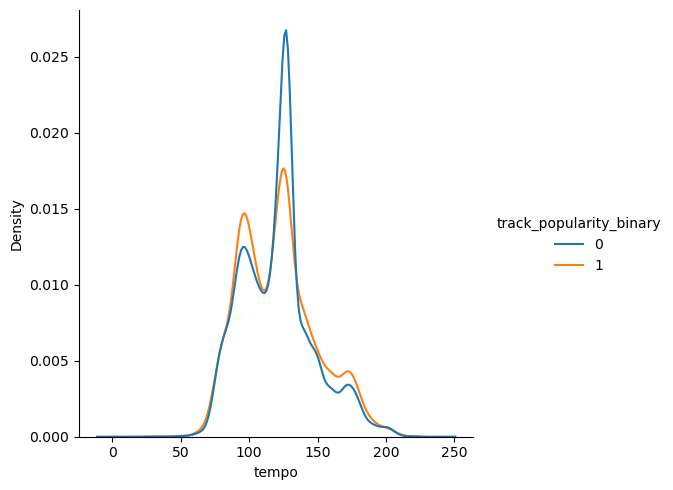

In [133]:
sns.displot(data = df_clean, x='tempo', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


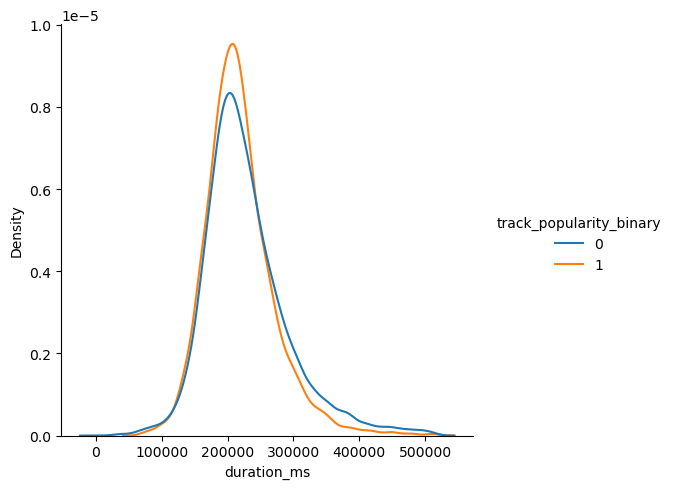

In [134]:
sns.displot(data = df_clean, x='duration_ms', hue='track_popularity_binary',
            common_norm=False, kind='kde')

plt.show()

#### ii.	Visualize relationships between continuous inputs GROUPED BY the response (outcome) unique values.

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


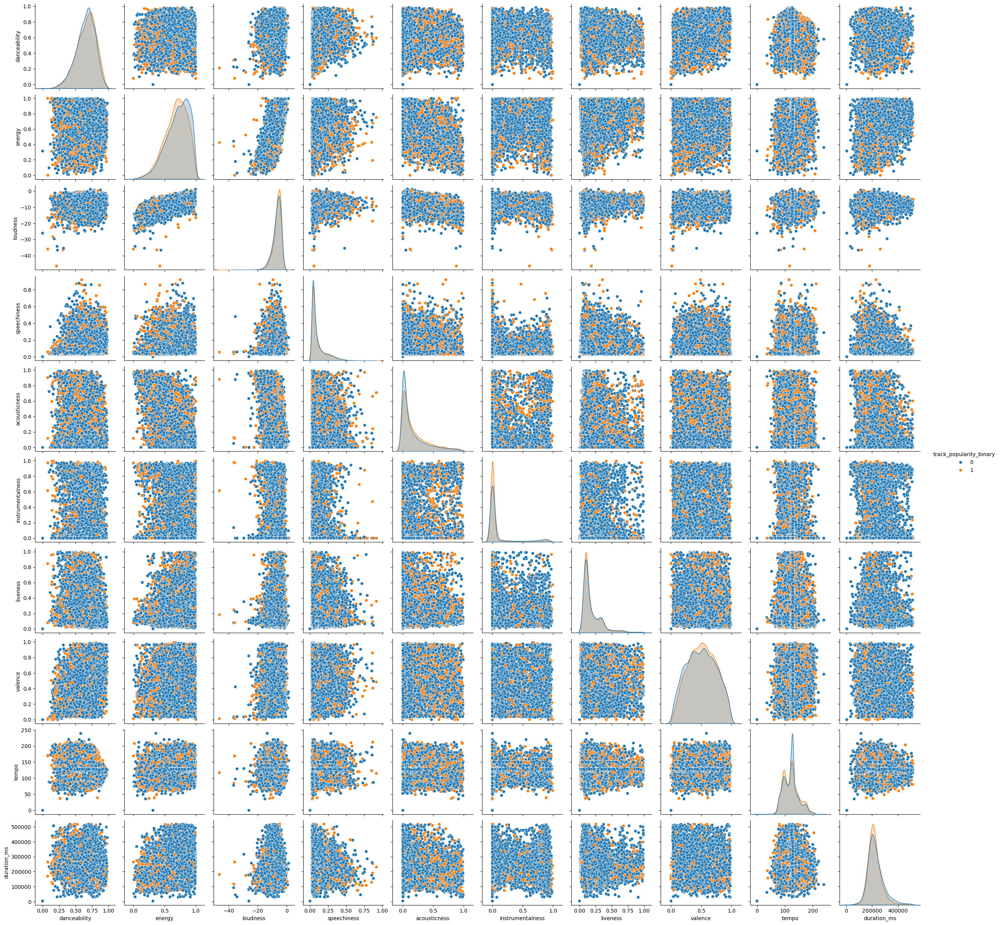

In [135]:
sns.pairplot(data=df_clean, vars=continuous_vars, hue='track_popularity_binary', diag_kws={'common_norm': False})
plt.show()

#### iii.	Visualize the counts of combinations between the response (outcome) and categorical inputs.

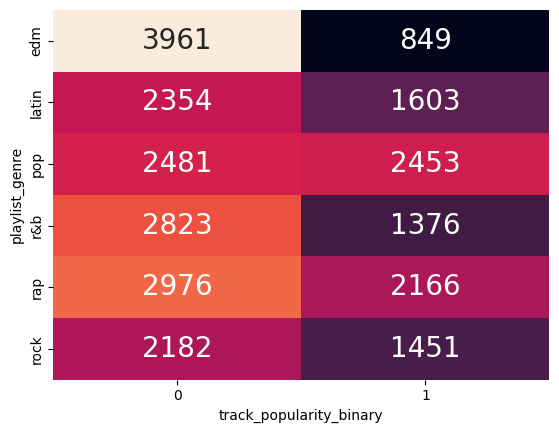

In [136]:
fig, ax = plt.subplots()

sns.heatmap( pd.crosstab( df_clean.playlist_genre, df_clean.track_popularity_binary), ax = ax,
             annot=True, annot_kws={'size': 20}, fmt='d',
             cbar=False)

plt.show()

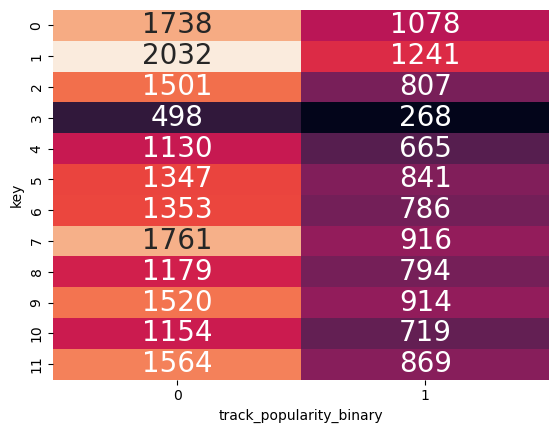

In [137]:
fig, ax = plt.subplots()

sns.heatmap( pd.crosstab( df_clean.key, df_clean.track_popularity_binary), ax = ax,
             annot=True, annot_kws={'size': 20}, fmt='d',
             cbar=False)

plt.show()

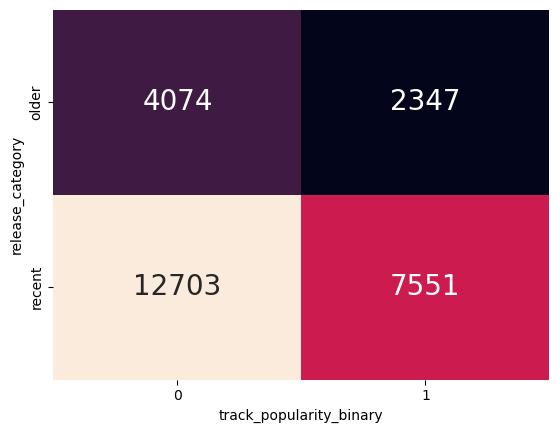

In [138]:
fig, ax = plt.subplots()

sns.heatmap( pd.crosstab( df_clean.release_category, df_clean.track_popularity_binary), ax = ax,
             annot=True, annot_kws={'size': 20}, fmt='d',
             cbar=False)

plt.show()

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


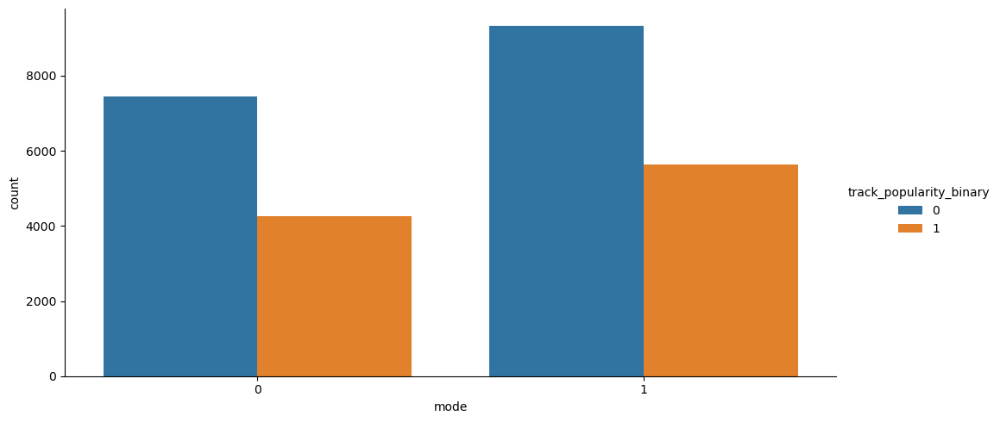

In [139]:
sns.catplot(data = df_clean, x='mode', hue='track_popularity_binary', kind='count', aspect = 2)

plt.show()

## C.	Cluster Analysis. 

### a.	Select variables. You MUST state which class of variables you used in your cluster analysis. 

I will be using continuous variables in my cluster analysis. 

### b.	Consider the following for your cluster analysis: 

#### i.	How many variables are you using relative to the number of observations?

In [140]:
num_continuous_vars = len(continuous_vars)

num_observations = df_clean.shape[0]

continuous_observation_ratio = num_continuous_vars / num_observations

print(f"Number of Continuous Variables: {num_continuous_vars}")
print(f"Number of Observations: {num_observations}")
print(f"Continuous Variables-to-Observation Ratio: {continuous_observation_ratio:.6f}")

Number of Continuous Variables: 10
Number of Observations: 26675
Continuous Variables-to-Observation Ratio: 0.000375


#### ii.	Are the variables you are using “Gaussian-like” or are the distributions “odd looking”? You must visualize the MARGINAL histograms of the variables IF you are using summary statistics derived from INPUTS or OUTPUTS. If you are using the INPUTS or OUTPUTS directly, you already visualized the MARGINAL distributions.

The variables I'm using are "odd looking" as visualized in charts above. 

#### iii.	Are the variables you are using highly correlated to each other? You must visualize the relationships between the variables you are using. If you are using the INPUTS/OUTPUTS directly then you already visualized those relationships.

As demonstrated in my heatmap in a previous section, the variables I'm using are not highly correlated to each other. 

#### iv.	How should you handle missing values? If you drop all rows with at least one missing value, how many observations would you still have (thus, how many complete cases do you have)?

I have already cleaned the data and have 26675 complete cases. 

### c.	You must use KMeans to execute the Cluster analysis.

### d.	First, use 2 clusters and:

In [141]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [142]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_clean[continuous_vars])

In [143]:
kmeans = KMeans(n_clusters=2, random_state=42)
df_clean['cluster'] = kmeans.fit_predict(df_scaled)

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


#### i.	Count the number of observations per identified cluster. Are the clusters balanced?

In [144]:
cluster_counts = df_clean['cluster'].value_counts()
print("Cluster Counts:")
print(cluster_counts)

Cluster Counts:
cluster
0    18860
1     7815
Name: count, dtype: int64


In [145]:
if abs(cluster_counts.iloc[0] - cluster_counts.iloc[1]) / cluster_counts.sum() < 0.1:
    print("The clusters are fairly balanced.")
else:
    print("The clusters are not fairly balanced.")

The clusters are not fairly balanced.


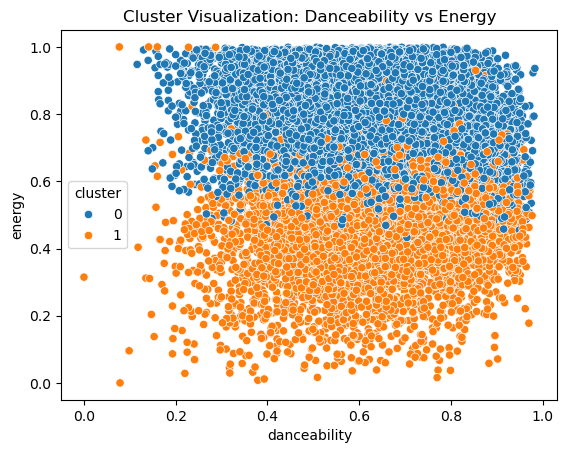

In [146]:
sns.scatterplot(data=df_clean, x='danceability', y='energy', hue='cluster')
plt.title("Cluster Visualization: Danceability vs Energy")
plt.show()

### e.	Then, identify the optimal number of clusters, and rerun KMeans for the optimal number.

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of

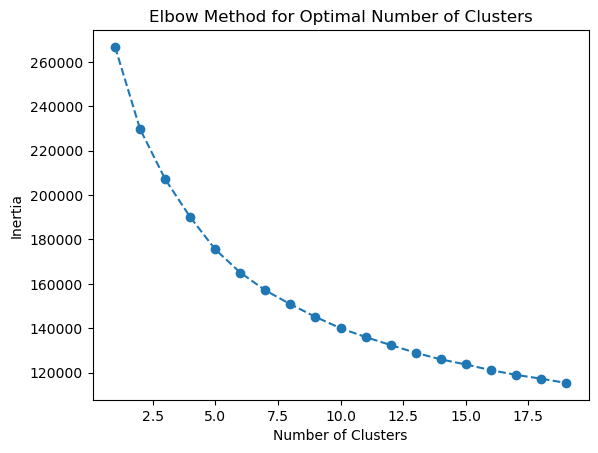

In [147]:
inertia = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 20), inertia, marker='o', linestyle='--')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal Number of Clusters")
plt.show()

In [148]:
kmeans_optimal = KMeans(n_clusters=6, random_state=42)
df_clean['cluster'] = kmeans_optimal.fit_predict(df_scaled)

C:\Users\sarah\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


#### i.	Count the number of observations per identified cluster.

In [149]:
cluster_counts = df_clean['cluster'].value_counts()
print("Cluster Counts:")
print(cluster_counts)

Cluster Counts:
cluster
1    8510
5    6949
2    3770
0    3527
4    2168
3    1751
Name: count, dtype: int64


#### ii.	Visualize the cluster results between 2 of the variables used for the cluster analysis.

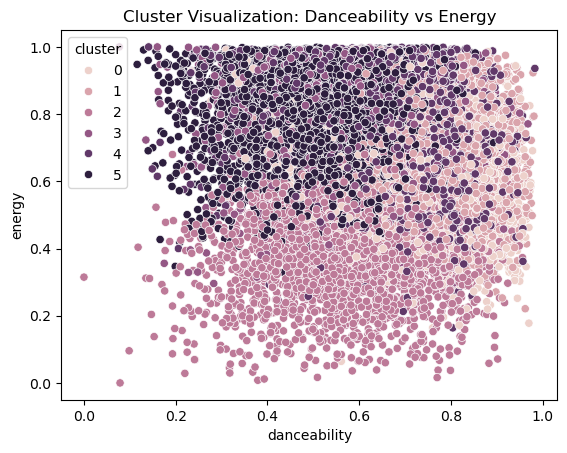

In [150]:
sns.scatterplot(data=df_clean, x='danceability', y='energy', hue='cluster')
plt.title("Cluster Visualization: Danceability vs Energy")
plt.show()

### f.	Interpret:

#### i.	Do the OPTIMAL number of clusters ALIGN with CATEGORIES of KNOWN grouping variables in your data?

No, the optimal number of clusters is lower than the number of variables.

##### 1.	If you are working on a CLASSIFICATION problem, are the identified clusters consistent with the outcome categories?

Clusters vs. Popularity:
track_popularity_binary     0     1
cluster                            
0                        2141  1386
1                        4965  3545
2                        2261  1509
3                        1177   574
4                        1793   375
5                        4440  2509


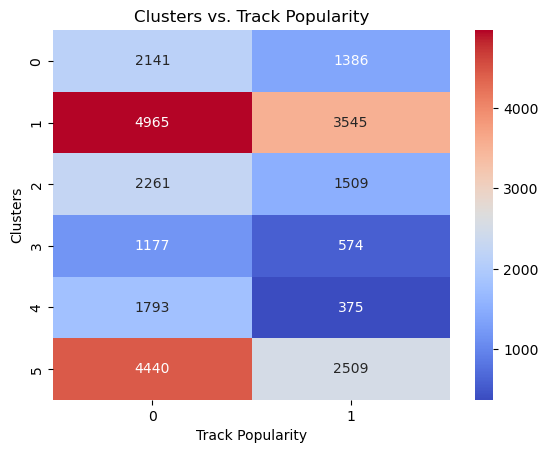

In [151]:
clusters_vs_popularity = pd.crosstab(df_clean['cluster'], df_clean['track_popularity_binary'])

print("Clusters vs. Popularity:")
print(clusters_vs_popularity)

sns.heatmap(clusters_vs_popularity, annot=True, cmap="coolwarm", fmt="d")
plt.title("Clusters vs. Track Popularity")
plt.xlabel("Track Popularity")
plt.ylabel("Clusters")
plt.show()

No, identified clusters are not consistent with outcome categories.

##### 2.	If you are working on a REGRESSION problem, are the identified clusters consistent with categories of a categorical input?

N/A

#### ii.	What are the CONDITIONAL distributions of the variables you used for clustering GIVEN the identified clusters?

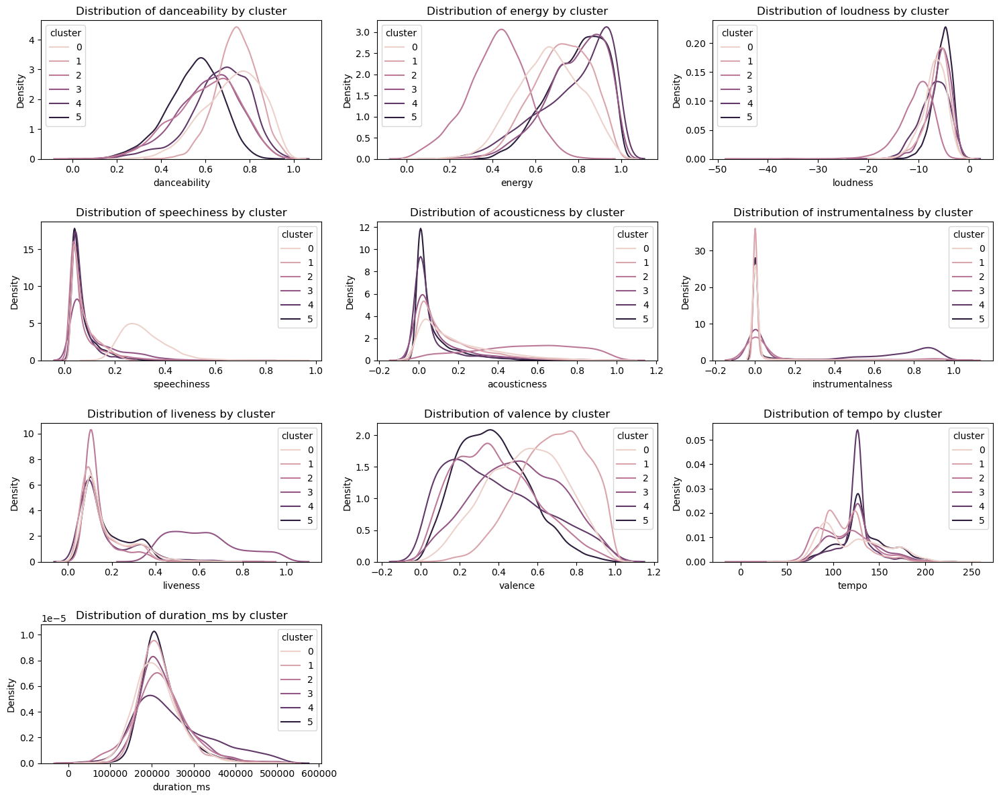

In [152]:
plt.figure(figsize=(15, 12))
for i, col in enumerate(continuous_vars):
    plt.subplot(len(continuous_vars) // 3 + 1, 3, i + 1)
    sns.kdeplot(data=df_clean, x=col, hue='cluster', common_norm=False)
    plt.title(f'Distribution of {col} by cluster')
plt.tight_layout()
plt.show()

The clusters show distinct differences in energy, danceability, loudness, and valence. They don't for speechiness, acousticness, instrumentalness, liveness, tempo, and duration_ms. 